<table align="center" width=100%>
    <tr>
        <td width="25%">
            <img src="voice.jpg">
        </td>
        <td>
            <div align="center">
                <font color="#21618C" size=24px>
                    <b>Gender Recognition by Voice and Speech Analysis
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

## TEAM 6:
#### 1) DITHYA PRASANNA
#### 2) SHAMANTH H S 
#### 3) PRIYADARSHINI B
#### 4) RAJATH HEGDE
#### 5) MEGHANA K
#### 6) PRASUN SARKAR

# Dataset

https://www.kaggle.com/primaryobjects/voicegender

# Problem Statement

**To identify a voice as male or female, based upon acoustic properties of the voice and speech.**

# Data Dictionary

1. **meanfreq** → mean frequency (in kHz)
2. **sd** → standard deviation of frequency
3. **median** → median frequency (in kHz)
4. **Q25** → first quantile (in kHz)
5. **Q75** → third quantile (in kHz)
6. **IQR** → interquantile range (in kHz)
7. **skew** → skewness (see note in specprop description)
8. **kurt** → kurtosis (see note in specprop description)
9. **sp.ent** → spectral entropy
10. **sfm** → spectral flatness
11. **mode** → mode frequency
12. **centroid** → frequency centroid (see specprop)
13. **meanfun** average of fundamental frequency measured across acoustic signal
14. **minfun** → minimum fundamental frequency measured across acoustic signal
15. **maxfun** → maximum fundamental frequency measured across acoustic signal
16. **meandom** → average of dominant frequency measured across acoustic signal
17. **mindom** → minimum of dominant frequency measured across acoustic signal
18. **maxdom** → maximum of dominant frequency measured across acoustic signal
19. **dfrange** → range of dominant frequency measured across acoustic signal
20. **modindx** → modulation index. Calculated as the accumulated absolute difference between adjacent measurements of fundamental frequencies divided by the frequency range
21. **label** → male or female (Target/dependent variable)

## Table of Contents

1. **[Import Libraries](#import_lib)**
2. **[Set Options](#set_options)**
3. **[Read Data](#Read_Data)**
4. **[Exploratory Data Analysis](#data_preparation)**
    - 4.1 - [Preparing the Dataset](#Data_Preparing)
        - 4.1.1 - [Data Dimension](#Data_Shape)
        - 4.1.2 - [Data Types](#Data_Types)
        - 4.1.3 - [Missing Values](#Missing_Values)
        - 4.1.4 - [Duplicate Data](#duplicate)
        - 4.1.5 - [Indexing](#indexing)
        - 4.1.6 - [Final Dataset](#final_dataset)
    - 4.2 - [Understanding the Dataset](#Data_Understanding)
        - 4.2.1 - [Summary Statistics](#Summary_Statistics)
        - 4.2.2 - [Correlation](#correlation)
        - 4.2.3 - [Analyze Numeric Variables](#analyze_num_var)
        - 4.2.4 - [Anaylze Target Variable](#analyze_tar_var)
5. **[Data Pre-Processing](#data_pre)**
    - 5.1 - [Outliers](#out)
        - 5.1.1 - [Discovery of Outliers](#dis_out)
        - 5.1.2 - [Removal of Outliers](#rem_out)
        - 5.1.3 - [Rechecking of Correlation](#rec_cor)
    - 5.2 - [Categorical Encoding](#cat_enc)
6. **[Building Logistic Regression Models](#bui_log_mod)**
    - 6.1 - [Logistic Regression - Basic Model](#bas_mod)
    - 6.2 - [Feature Transformation](#fea_tra)
    - 6.3 - [Feature Scaling](#fea_sca)
    - 6.4 - [Logistic Regression - Full Model - After Feature Scaling](#mod_aft_sca)
    - 6.5 - [Feature Selection](#fea_sel)
        - 6.5.1 - [Forward Selection](#for_sel)
        - 6.5.2 - [Backward Elimination](#bac_eli)
    - 6.6 - [Logistic Regression - Full Model - After Feature Selection](#mod_fea_sel)
    - 6.7 - [Selecting Optimum cut-off value](#opt_cut_sel)
7. **[Naive Bayes](#nai_bay)**
8. **[KNN](#knn)**
9. **[Decision Tree](#deci_tree)**
10. **[Random Forest](#rnd_frst)**
11. **[AdaBoost](#ada_boost)**
12. **[Gradient Boost](#grd_boost)**
13. **[XG Boost](#xgb)**
14. **[Stacking](#stack)**
    - 14.1 - [Stacking model with AdaBoostClassifier as final estimator](#stack_ada)
    - 14.2 - [Stacking model with GradientBoostingClassifier as final estimator](#stack_gboost)
    - 14.3 - [Stacking model with XGBoostClassifier as final estimator](#stack_xgb)
15. **[Displaying Score Summary](#dis_sco_sum)**
16. **[Deployment Link](#depl)**
17. **[Conclusion](#conclu)**
18. **[References](#Refer)**

# 1. Import Libraries <a id='import_lib'></a>

In [1]:
# import 'Pandas' 
import pandas as pd 

# import 'Numpy' 
import numpy as np

# import subpackage of Matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# import 'Seaborn' 
import seaborn as sns

# to suppress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

# import train-test split 
from sklearn.model_selection import train_test_split

import statsmodels.api as sm
from scipy import stats
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler 

from sklearn.linear_model import LogisticRegression
from mlxtend.feature_selection import SequentialFeatureSelector as sfs


# import various functions from sklearn
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

# import the XGBoost function for classification
from xgboost import XGBClassifier


# import the functions for visualizing the decision tree
import pydotplus
from IPython.display import Image  

# set the plot size using 'rcParams'
# once the plot size is set using 'rcParams', it sets the size of all the forthcoming plots in the file
# pass width and height in inches to 'figure.figsize' 
plt.rcParams['figure.figsize'] = [15,8]

# 2. Set Options <a id='set_options'></a>

In [2]:
# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None
 
# to display the float values upto 6 decimal places     
pd.options.display.float_format = '{:.6f}'.format


# 3. Read Data <a id='Read_Data'></a>

In [3]:
# load the csv file
df_gender = pd.read_csv('voice.csv')

# display the first five observations
df_gender.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,0.000000,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,0.000000,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,0.000000,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,0.083878,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,0.104261,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [4]:
df_gender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   obje

# 4. Exploratory Data Analysis <a id='data_preparation'></a>

## 4.1 Preparing the Dataset <a id='Data_Preparing'></a>

### 4.1.1 Data Dimensions <a id='Data_Shape'></a>

In [5]:
df_gender.shape

(3168, 21)

In this dataset we have 3168 records across 21 features

### 4.1.2 Data Types <a id='Data_Types'></a>

In [6]:
df_gender.dtypes

meanfreq    float64
sd          float64
median      float64
Q25         float64
Q75         float64
IQR         float64
skew        float64
kurt        float64
sp.ent      float64
sfm         float64
mode        float64
centroid    float64
meanfun     float64
minfun      float64
maxfun      float64
meandom     float64
mindom      float64
maxdom      float64
dfrange     float64
modindx     float64
label        object
dtype: object

The dataset contains **1 object column and 20 float columns**

### 4.1.3 Missing Values <a id='Missing_Values'></a>

In [7]:
missing_value = pd.DataFrame({
    'Missing Value': df_gender.isnull().sum(),
    'Percentage': (df_gender.isnull().sum() / len(df_gender))*100
})

In [8]:
missing_value.sort_values(by='Percentage', ascending=False)

,Missing Value,Percentage
meanfreq,0,0.000000
centroid,0,0.000000
modindx,0,0.000000
dfrange,0,0.000000
maxdom,0,0.000000
mindom,0,0.000000
meandom,0,0.000000
maxfun,0,0.000000
minfun,0,0.000000
meanfun,0,0.000000


There are **no missing values** present in this dataset

**Visualising missing values using Heatmap**

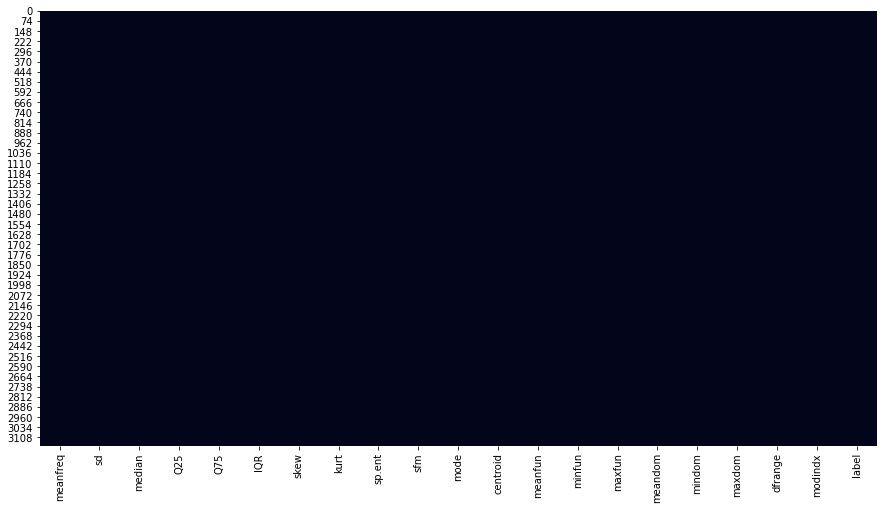

In [9]:
# set the figure size
plt.figure(figsize=(15, 8))

# plot heatmap to check null values
# isnull(): returns 'True' for a missing value
# cbar: specifies whether to draw a colorbar; draws the colorbar for 'True' 
sns.heatmap(df_gender.isnull(), cbar=False)

# display the plot
plt.show()

**Graphical proof that there are no missing values**

### 4.1.4 Duplicate Data <a id='duplicate'></a>

In [10]:
duplicate = df_gender.duplicated().sum()
print('There are {} duplicated rows in the data'.format(duplicate))

There are 2 duplicated rows in the data


**Getting rid of duplicate data**

In [11]:
df_gender.drop_duplicates(inplace=True)

**Checking for duplicate data after removal of duplicates**

In [12]:
duplicate = df_gender.duplicated().sum()
print('There are {} duplicated rows in the data'.format(duplicate))

There are 0 duplicated rows in the data


### 4.1.5 Indexing <a id='indexing'></a>

In [13]:
df_gender.shape

(3166, 21)

There are **3166 records** after dropping duplicates

In [14]:
df_gender.tail()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
3163,0.131884,0.084734,0.153707,0.049285,0.201144,0.151859,1.762129,6.630383,0.962934,0.763182,0.200836,0.131884,0.182790,0.083770,0.262295,0.832899,0.007812,4.210938,4.203125,0.161929,female
3164,0.116221,0.089221,0.076758,0.042718,0.204911,0.162193,0.693730,2.503954,0.960716,0.709570,0.013683,0.116221,0.188980,0.034409,0.275862,0.909856,0.039062,3.679688,3.640625,0.277897,female
3165,0.142056,0.095798,0.183731,0.033424,0.224360,0.190936,1.876502,6.604509,0.946854,0.654196,0.008006,0.142056,0.209918,0.039506,0.275862,0.494271,0.007812,2.937500,2.929688,0.194759,female
3166,0.143659,0.090628,0.184976,0.043508,0.219943,0.176435,1.591065,5.388298,0.950436,0.675470,0.212202,0.143659,0.172375,0.034483,0.250000,0.791360,0.007812,3.593750,3.585938,0.311002,female
3167,0.165509,0.092884,0.183044,0.070072,0.250827,0.180756,1.705029,5.769115,0.938829,0.601529,0.267702,0.165509,0.185607,0.062257,0.271186,0.227022,0.007812,0.554688,0.546875,0.350000,female


**The last 5 index values range from 3163-3167 but we have only 3166 records thus the indexes need to be reset**

In [15]:
df_gender.reset_index(inplace=True)

In [16]:
df_gender.tail()

,index,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
3161,3163,0.131884,0.084734,0.153707,0.049285,0.201144,0.151859,1.762129,6.630383,0.962934,0.763182,0.200836,0.131884,0.182790,0.083770,0.262295,0.832899,0.007812,4.210938,4.203125,0.161929,female
3162,3164,0.116221,0.089221,0.076758,0.042718,0.204911,0.162193,0.693730,2.503954,0.960716,0.709570,0.013683,0.116221,0.188980,0.034409,0.275862,0.909856,0.039062,3.679688,3.640625,0.277897,female
3163,3165,0.142056,0.095798,0.183731,0.033424,0.224360,0.190936,1.876502,6.604509,0.946854,0.654196,0.008006,0.142056,0.209918,0.039506,0.275862,0.494271,0.007812,2.937500,2.929688,0.194759,female
3164,3166,0.143659,0.090628,0.184976,0.043508,0.219943,0.176435,1.591065,5.388298,0.950436,0.675470,0.212202,0.143659,0.172375,0.034483,0.250000,0.791360,0.007812,3.593750,3.585938,0.311002,female
3165,3167,0.165509,0.092884,0.183044,0.070072,0.250827,0.180756,1.705029,5.769115,0.938829,0.601529,0.267702,0.165509,0.185607,0.062257,0.271186,0.227022,0.007812,0.554688,0.546875,0.350000,female


**The indexes have been reset but a new column 'index' is created which needs to be dropped**

In [17]:
df_gender.drop(['index'],inplace=True,axis=1)

### 4.1.6 Final Dataset <a id='final_dataset'></a>

In [18]:
df_gender.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,0.000000,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,0.000000,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,0.000000,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,0.083878,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,0.104261,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [19]:
df_gender.shape

(3166, 21)

The final dataset has **3166 records and 21 features with no missing and duplicate values**

## 4.2 Understanding the Dataset <a id='Data_Understanding'></a>

### 4.2.1 Summary Statistics <a id='Summary_Statistics'></a>

**Numeric Variables**

In [20]:
df_gender.describe(include = np.number)

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000,3166.000000
mean,0.180886,0.057130,0.185593,0.140440,0.224748,0.084308,3.140895,36.587139,0.895144,0.408348,0.165248,0.180886,0.142811,0.036801,0.258837,0.828868,0.052631,5.044220,4.991589,0.173751
std,0.029916,0.016656,0.036354,0.048687,0.023636,0.042790,4.241768,134.969236,0.044988,0.177476,0.077212,0.029916,0.032314,0.019225,0.030085,0.525009,0.063301,3.517226,3.516072,0.119484
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163649,0.041942,0.169578,0.111086,0.208740,0.042538,1.649353,5.666817,0.861823,0.258126,0.118008,0.163649,0.116990,0.018223,0.253968,0.419640,0.007812,2.070312,2.041016,0.099726
50%,0.184814,0.059162,0.190016,0.140255,0.225668,0.094280,2.197623,8.327893,0.901823,0.396472,0.186530,0.184814,0.140585,0.046110,0.271186,0.765625,0.023438,4.992188,4.945312,0.139357
75%,0.199118,0.067023,0.210588,0.175931,0.243640,0.114168,2.932527,13.649803,0.928717,0.533795,0.221070,0.199118,0.169605,0.047904,0.277457,1.176824,0.070312,7.005859,6.992188,0.209141
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


<br>Inferences:</br>
<br></br>
<br>1. The mean frequency of all voices recorded is 0.18 kHz.</br>
<br>2. About 50% of frequencies recorded lie below 0.09 kHz.</br>
<br>3. The variable `kurt` has a maximum value that is so much greater than its minimum of average value. This indicates the presence of outliers.</br>

**Categorical Variables**

In [21]:
df_gender.describe(include = object)

,label
count,3166
unique,2
top,female
freq,1583


In [22]:
df_gender['label'].value_counts()

female    1583
male      1583
Name: label, dtype: int64

<br>Inferences:</br>
<br></br>
<br>    1. There is only one categorical variable `Label`, which is our target variable.</br>
<br>    2. Labels are both evenly distributed, with a count of 1583 each for *male* and *female* labels.</br>

### 4.2.2 Correlation <a id='correlation'></a>

In [23]:
data_num_features = df_gender.select_dtypes(include=np.number)

# print the names of the numeric variables 
print('The numerical columns in the dataset are: ',data_num_features.columns)

The numerical columns in the dataset are:  Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx'],
      dtype='object')


In [24]:
corr =  data_num_features.corr()

# print the correlation matrix
corr

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
meanfreq,1.000000,-0.739125,0.925425,0.911552,0.740809,-0.627975,-0.322268,-0.316007,-0.601093,-0.784256,0.687626,1.000000,0.461146,0.384080,0.273958,0.536548,0.229123,0.519556,0.515601,-0.217087
sd,-0.739125,1.000000,-0.562744,-0.846895,-0.160946,0.874713,0.314562,0.346227,0.716693,0.838536,-0.529245,-0.739125,-0.466360,-0.345526,-0.129506,-0.482560,-0.357945,-0.482226,-0.475940,0.122560
median,0.925425,-0.562744,1.000000,0.775156,0.731605,-0.477865,-0.257343,-0.243342,-0.501824,-0.661354,0.677286,0.925425,0.415282,0.337874,0.251378,0.455955,0.190809,0.439118,0.435826,-0.213533
Q25,0.911552,-0.846895,0.775156,1.000000,0.477133,-0.874264,-0.319436,-0.350170,-0.648178,-0.767249,0.591383,0.911552,0.545158,0.320903,0.199677,0.467141,0.302524,0.459471,0.454176,-0.141274
Q75,0.740809,-0.160946,0.731605,0.477133,1.000000,0.009490,-0.206242,-0.148790,-0.174545,-0.377621,0.486600,0.740809,0.155311,0.258180,0.285614,0.359011,-0.024201,0.335013,0.335559,-0.216666
IQR,-0.627975,0.874713,-0.477865,-0.874264,0.009490,1.000000,0.249538,0.316242,0.641097,0.664403,-0.404100,-0.627975,-0.534503,-0.222517,-0.069429,-0.333213,-0.357587,-0.337742,-0.331415,0.041063
skew,-0.322268,0.314562,-0.257343,-0.319436,-0.206242,0.249538,1.000000,0.977021,-0.195585,0.079552,-0.434844,-0.322268,-0.167704,-0.216958,-0.080817,-0.336891,-0.061574,-0.305830,-0.304821,-0.169346
kurt,-0.316007,0.346227,-0.243342,-0.350170,-0.148790,0.316242,0.977021,1.000000,-0.127742,0.109788,-0.406715,-0.316007,-0.194591,-0.203211,-0.045634,-0.303300,-0.103292,-0.274701,-0.272931,-0.205556
sp.ent,-0.601093,0.716693,-0.501824,-0.648178,-0.174545,0.641097,-0.195585,-0.127742,1.000000,0.866491,-0.325096,-0.601093,-0.513345,-0.305930,-0.120720,-0.293549,-0.294731,-0.324452,-0.319252,0.198172
sfm,-0.784256,0.838536,-0.661354,-0.767249,-0.377621,0.664403,0.079552,0.109788,0.866491,1.000000,-0.485611,-0.784256,-0.421489,-0.362498,-0.192474,-0.428644,-0.289189,-0.437166,-0.432103,0.211804


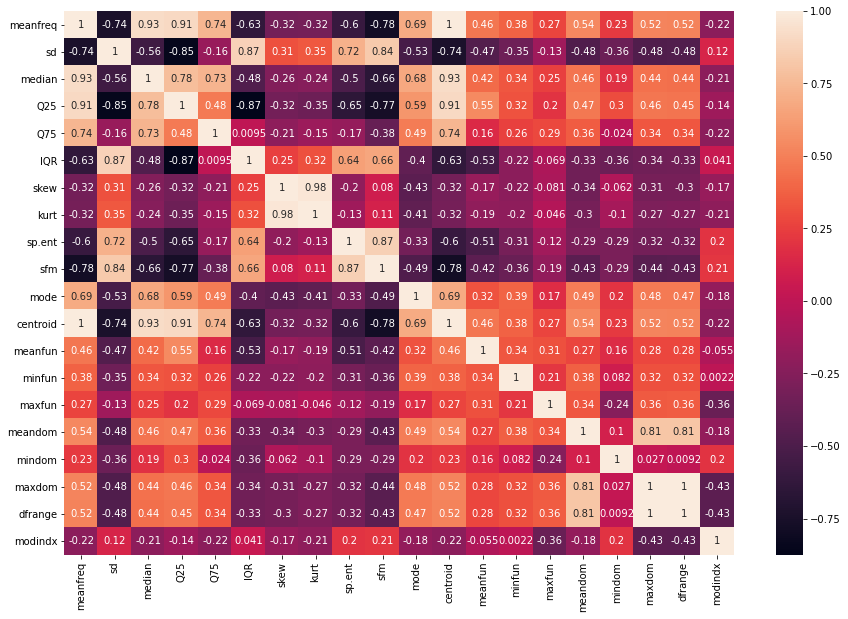

In [25]:
plt.figure(figsize=(15,10))
sns.heatmap(data_num_features.corr(method='pearson'), annot=True)
plt.show()

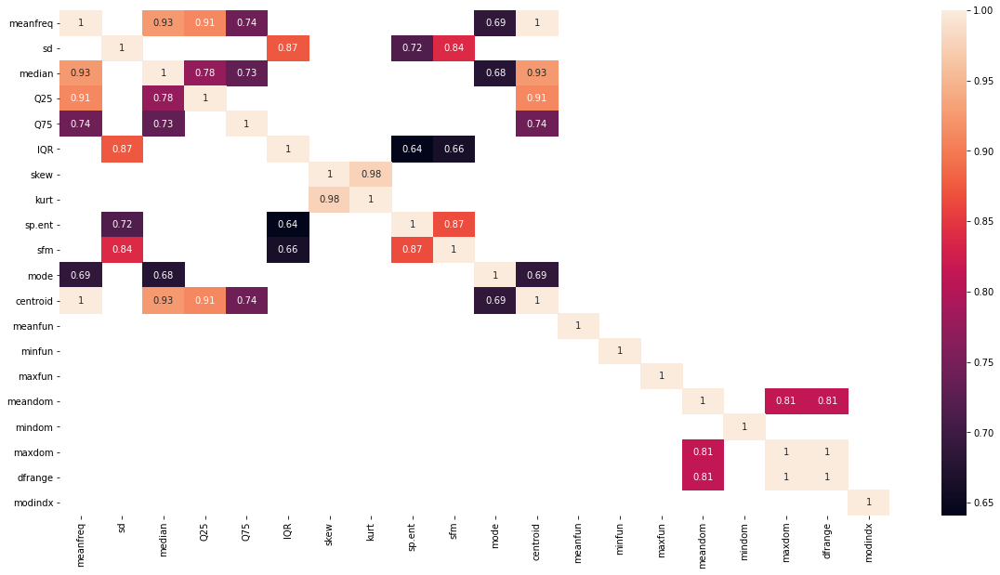

In [26]:
plt.figure(figsize=(20,10))
corr = data_num_features.corr(method='pearson')
sns.heatmap(corr[corr>abs(0.6)], annot=True)
plt.show()

**Removing variables *`centroid`*, *`maxdom`* and *`kurt`* as they are showing extremely high multicollinearity.**

In [27]:
data_num_features.drop(['centroid','maxdom','kurt'], inplace = True, axis=1)

In [28]:
data_num_features.columns

Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'sp.ent',
       'sfm', 'mode', 'meanfun', 'minfun', 'maxfun', 'meandom', 'mindom',
       'dfrange', 'modindx'],
      dtype='object')

**Checking for correlation again.**

In [29]:
corr =  data_num_features.corr()

# print the correlation matrix
corr

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx
meanfreq,1.000000,-0.739125,0.925425,0.911552,0.740809,-0.627975,-0.322268,-0.601093,-0.784256,0.687626,0.461146,0.384080,0.273958,0.536548,0.229123,0.515601,-0.217087
sd,-0.739125,1.000000,-0.562744,-0.846895,-0.160946,0.874713,0.314562,0.716693,0.838536,-0.529245,-0.466360,-0.345526,-0.129506,-0.482560,-0.357945,-0.475940,0.122560
median,0.925425,-0.562744,1.000000,0.775156,0.731605,-0.477865,-0.257343,-0.501824,-0.661354,0.677286,0.415282,0.337874,0.251378,0.455955,0.190809,0.435826,-0.213533
Q25,0.911552,-0.846895,0.775156,1.000000,0.477133,-0.874264,-0.319436,-0.648178,-0.767249,0.591383,0.545158,0.320903,0.199677,0.467141,0.302524,0.454176,-0.141274
Q75,0.740809,-0.160946,0.731605,0.477133,1.000000,0.009490,-0.206242,-0.174545,-0.377621,0.486600,0.155311,0.258180,0.285614,0.359011,-0.024201,0.335559,-0.216666
IQR,-0.627975,0.874713,-0.477865,-0.874264,0.009490,1.000000,0.249538,0.641097,0.664403,-0.404100,-0.534503,-0.222517,-0.069429,-0.333213,-0.357587,-0.331415,0.041063
skew,-0.322268,0.314562,-0.257343,-0.319436,-0.206242,0.249538,1.000000,-0.195585,0.079552,-0.434844,-0.167704,-0.216958,-0.080817,-0.336891,-0.061574,-0.304821,-0.169346
sp.ent,-0.601093,0.716693,-0.501824,-0.648178,-0.174545,0.641097,-0.195585,1.000000,0.866491,-0.325096,-0.513345,-0.305930,-0.120720,-0.293549,-0.294731,-0.319252,0.198172
sfm,-0.784256,0.838536,-0.661354,-0.767249,-0.377621,0.664403,0.079552,0.866491,1.000000,-0.485611,-0.421489,-0.362498,-0.192474,-0.428644,-0.289189,-0.432103,0.211804
mode,0.687626,-0.529245,0.677286,0.591383,0.486600,-0.404100,-0.434844,-0.325096,-0.485611,1.000000,0.324946,0.385673,0.172367,0.491721,0.197857,0.474356,-0.182508


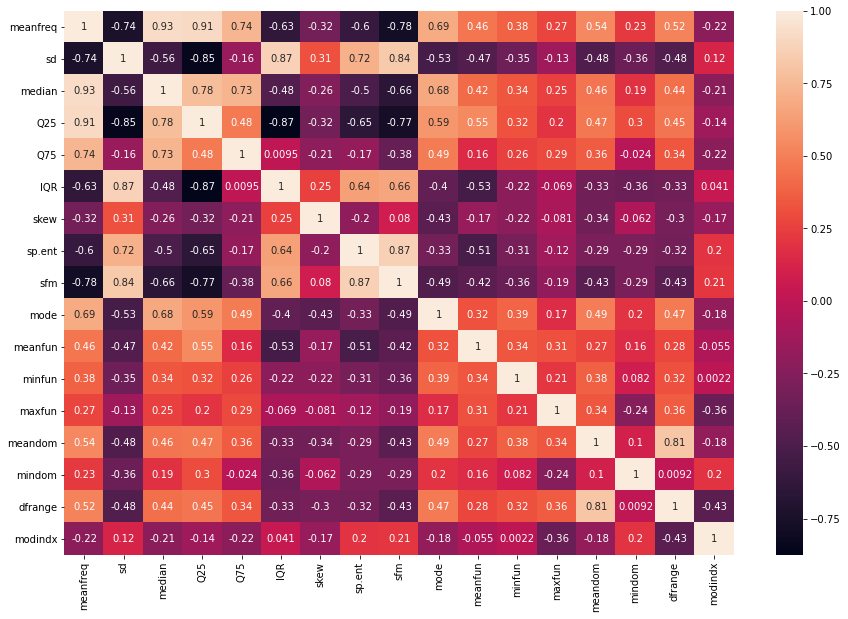

In [30]:
plt.figure(figsize=(15,10))
sns.heatmap(data_num_features.corr(method='pearson'), annot=True)
plt.show()

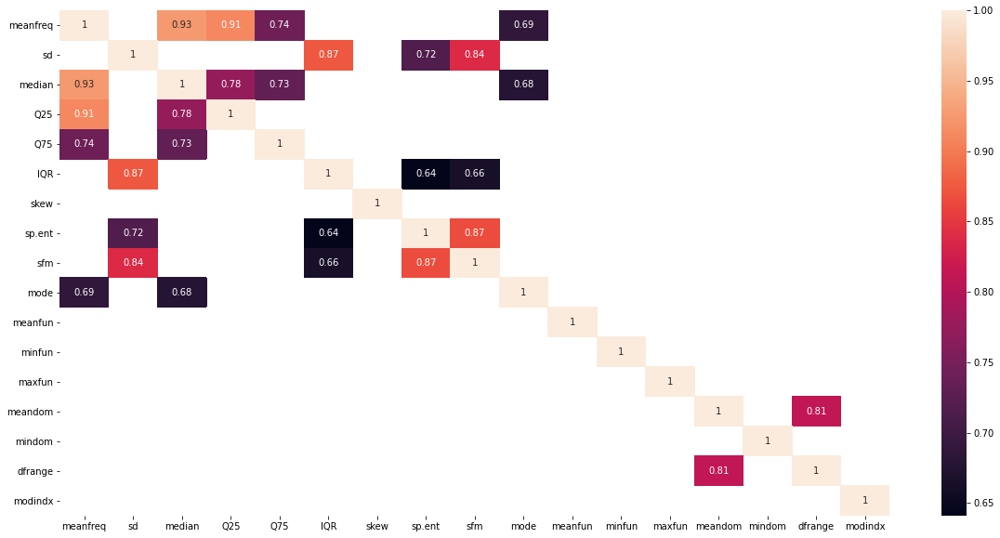

In [31]:
plt.figure(figsize=(20,10))
corr = data_num_features.corr(method='pearson')
sns.heatmap(corr[corr>abs(0.6)], annot=True)
plt.show()

<br>Inferences:</br>
<br></br>
<br>    1. Meanfreq, median, mode, Q25 and Q75 all show high correlation amongst each other.</br>
<br>    2. sd has a high positive correlation with IQR, sp.ent and sfm.</br>
<br>    3. meandom and dfrange also share a high positve correlation.</br>

### 4.2.3 Analyse Numeric Variables <a id='analyze_num_var'></a>

**Distribution plots of all the variables**

In [32]:
voice = pd.melt(df_gender, id_vars='label', value_vars=df_gender.columns[:-1], var_name='properties')

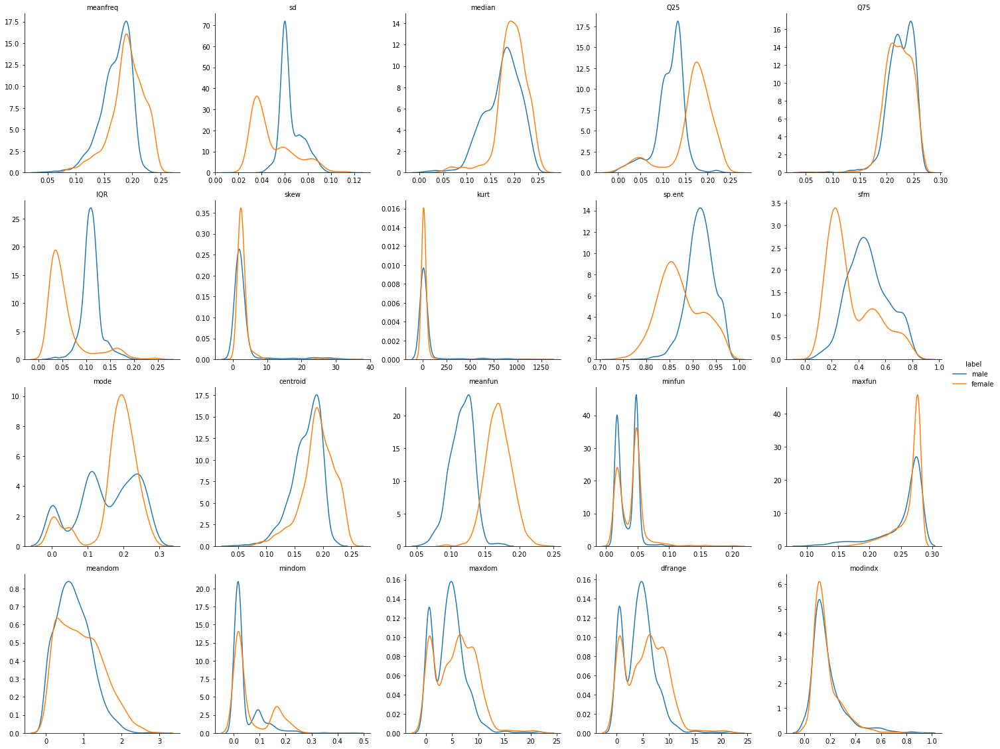

In [33]:
g = sns.FacetGrid(voice, col='properties', col_wrap=5, hue='label', sharex=False, sharey=False, height=4)
g = g.map(sns.kdeplot, 'value').add_legend().set_titles("{col_name}").set_axis_labels('')

**Violin Plot**

In [34]:
df = df_gender.iloc[:, :10]
df =  (df-df.mean())/df.std()

<AxesSubplot:>

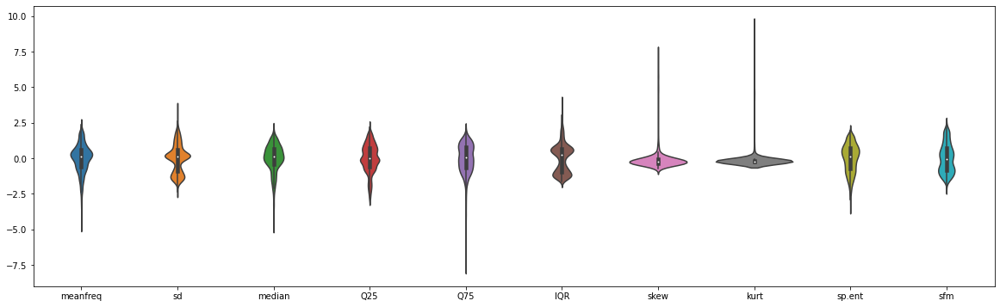

In [35]:
plt.figure(figsize=(20,6))
sns.violinplot(data=df)

**Interpretation**: sd and IQR show bimodal distribution.

<AxesSubplot:xlabel='properties', ylabel='value'>

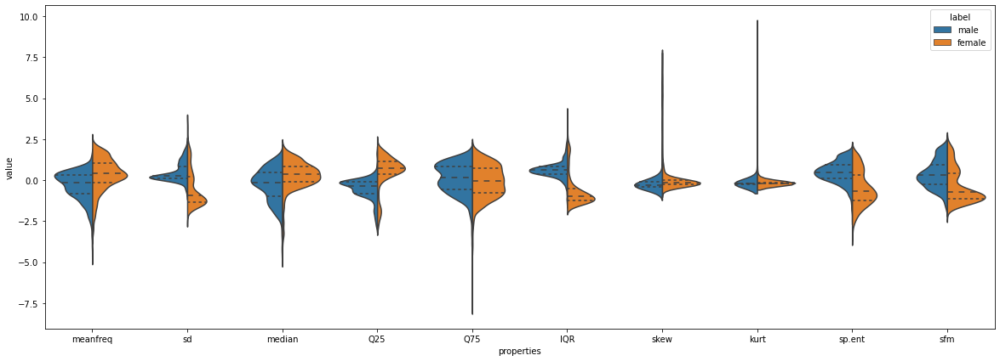

In [36]:
df1 = pd.concat([df, df_gender['label']], axis=1)
df1 = pd.melt(df1, id_vars='label', var_name='properties')

plt.figure(figsize=(20,7))
sns.violinplot(x='properties', y='value', hue='label', split=True, inner='quart', data=df1)

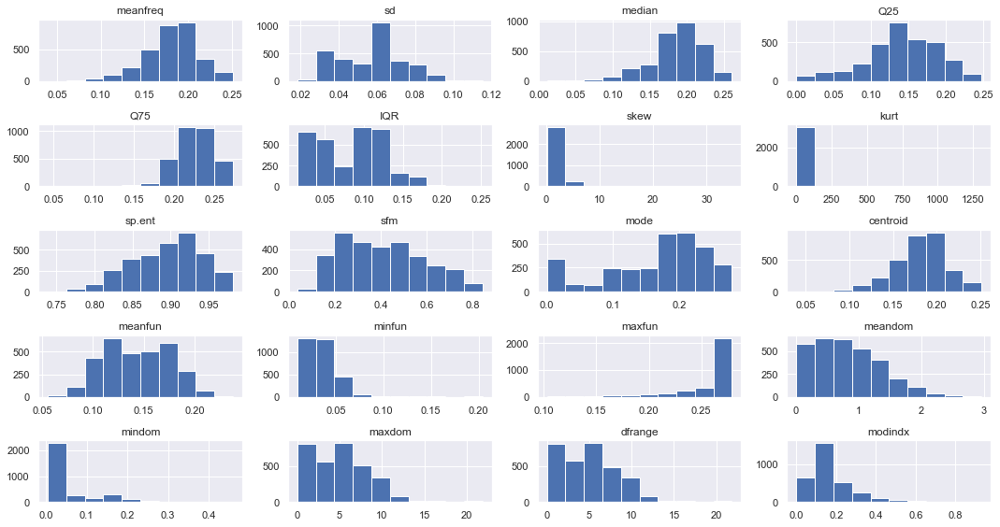

Skewness:


meanfreq   -0.616720
sd          0.136343
median     -1.013090
Q25        -0.490297
Q75        -0.900129
IQR         0.295525
skew        4.931605
kurt        5.870593
sp.ent     -0.431897
sfm         0.340159
mode       -0.836569
centroid   -0.616720
meanfun     0.038785
minfun      1.877917
maxfun     -2.237947
meandom     0.611174
mindom      1.662172
maxdom      0.723140
dfrange     0.725153
modindx     2.064099
dtype: float64

In [37]:
sns.set_theme(style="darkgrid")
df_gender.hist()

# adjust the subplots
plt.tight_layout()

# display the plot
plt.show()  

# print the skewness for each numeric independent variable
print('Skewness:')
# we drop the target variable using drop()
# 'axis=1' drops the specified column
# skew() returns the coefficient of skewness for each variable
df_gender.skew()

<Figure size 720x360 with 0 Axes>

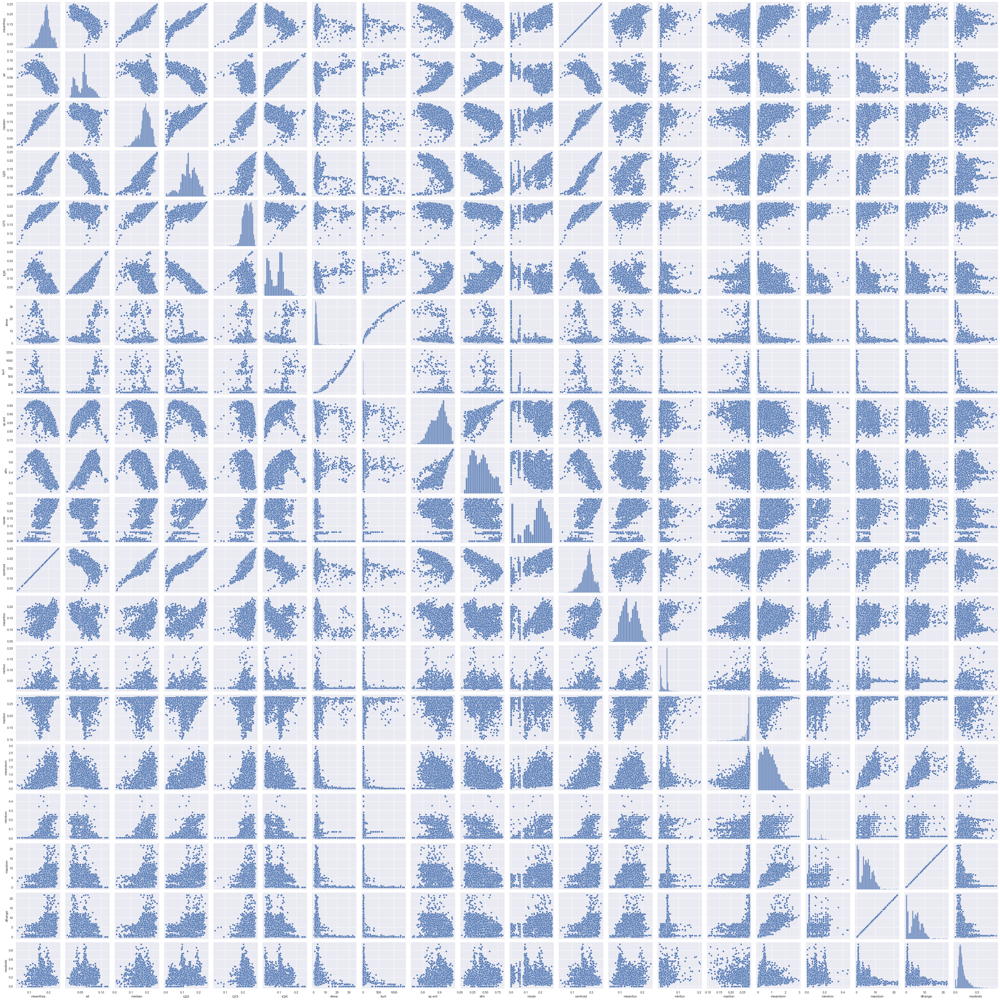

In [38]:
plt.figure(figsize=(10,5))
sns.pairplot(df_gender)
plt.show()

### 4.2.4 Analyse Target Variable <a id='analyze_tar_var'></a>

In [39]:
df_gender['label'].value_counts()

female    1583
male      1583
Name: label, dtype: int64

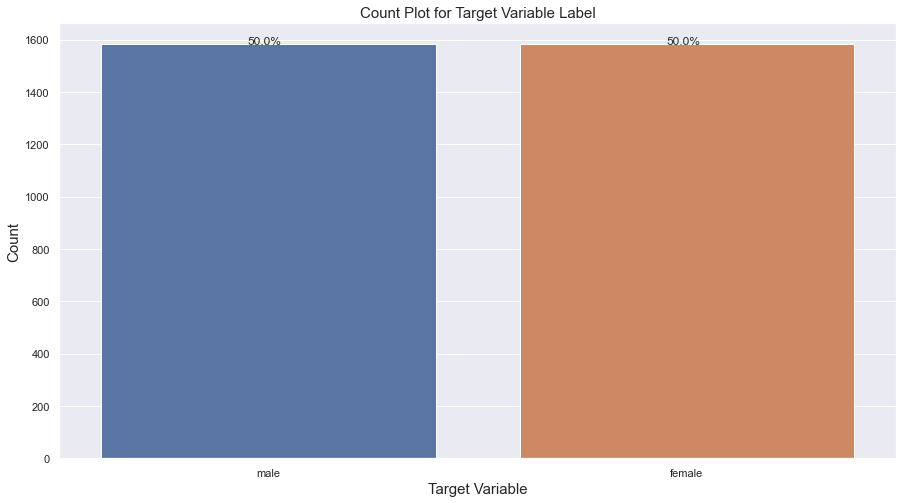

In [41]:
# consider only the target variable
df_target = df_gender['label'].copy()

df_target.value_counts()
sns.countplot(x = df_target)

plt.text(x = 0.95, y = df_target.value_counts()[0] + 1, s = str(round((df_target.value_counts()[0])*100/len(df_target),2)) + '%')
plt.text(x = -0.05, y = df_target.value_counts()[1] +1, s = str(round((df_target.value_counts()[1])*100/len(df_target),2)) + '%')

plt.title('Count Plot for Target Variable Label', fontsize = 15)
plt.xlabel('Target Variable', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

# to show the plot
plt.show()

# 5. Data Preprocessing <a id='data_pre'></a>

Dropping columns `centroid`, `kurt` and `maxdom` as they all show extremely high multicollinearity with the other variables in the dataset.

In [42]:
df_gender.drop(['centroid','maxdom','kurt'], inplace = True, axis=1)

In [43]:
df_gender.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,0.893369,0.491918,0.000000,0.084279,0.015702,0.275862,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,0.892193,0.513724,0.000000,0.107937,0.015826,0.250000,0.009014,0.007812,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,0.846389,0.478905,0.000000,0.098706,0.015656,0.271186,0.007990,0.007812,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,0.963322,0.727232,0.083878,0.088965,0.017798,0.250000,0.201497,0.007812,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,0.971955,0.783568,0.104261,0.106398,0.016931,0.266667,0.712812,0.007812,5.476562,0.208274,male


In [44]:
df_gender.shape

(3166, 18)

## 5.1 Outliers <a id='out'></a>

### 5.1.1 Discovery of Outliers<a id='dis_out'></a>

**Identifying outliers using IQR**

In [45]:
Q1 = df_gender.quantile(0.25)
Q3 = df_gender.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

meanfreq   0.035469
sd         0.025081
median     0.041010
Q25        0.064846
Q75        0.034900
IQR        0.071630
skew       1.283174
sp.ent     0.066894
sfm        0.275669
mode       0.103062
meanfun    0.052615
minfun     0.029681
maxfun     0.023488
meandom    0.757184
mindom     0.062500
dfrange    4.951172
modindx    0.109415
dtype: float64


In [46]:
outlier = pd.DataFrame((df_gender < (Q1 - 1.5 * IQR)) | (df_gender > (Q3 + 1.5 * IQR)))

In [47]:
for i in outlier.columns:
    print('Total number of Outliers in column {} are {}'.format(i, (len(outlier[outlier[i] == True][i]))))

Total number of Outliers in column IQR are 10
Total number of Outliers in column Q25 are 33
Total number of Outliers in column Q75 are 27
Total number of Outliers in column dfrange are 41
Total number of Outliers in column label are 0
Total number of Outliers in column maxfun are 313
Total number of Outliers in column meandom are 19
Total number of Outliers in column meanfreq are 64
Total number of Outliers in column meanfun are 0
Total number of Outliers in column median are 109
Total number of Outliers in column mindom are 275
Total number of Outliers in column minfun are 38
Total number of Outliers in column mode are 0
Total number of Outliers in column modindx are 208
Total number of Outliers in column sd are 10
Total number of Outliers in column sfm are 0
Total number of Outliers in column skew are 230
Total number of Outliers in column sp.ent are 6


**Visualizing outliers using Boxplots**

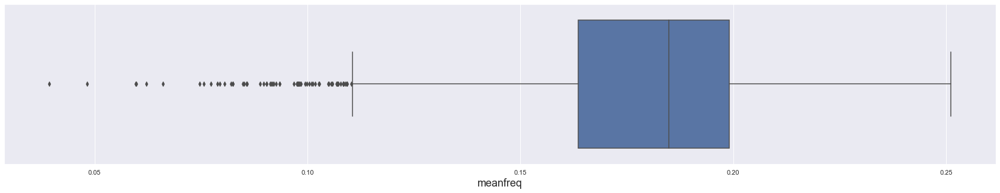

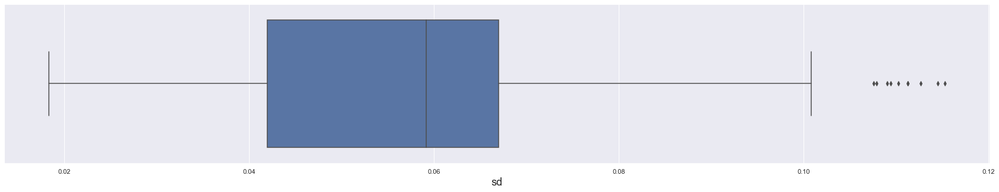

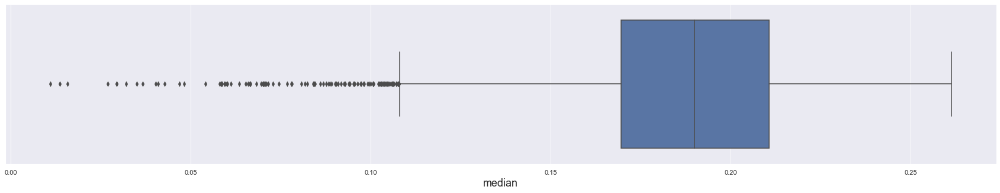

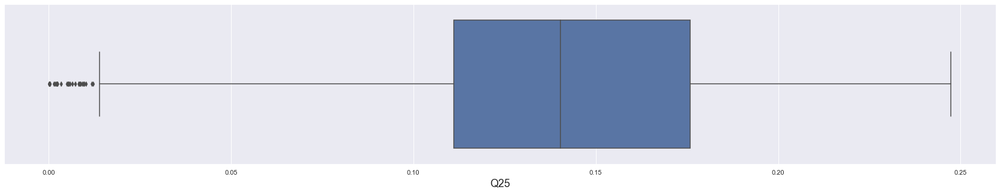

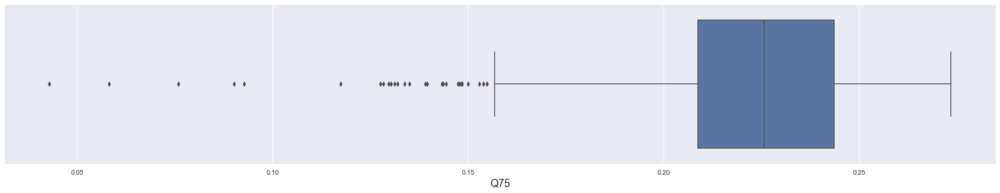

...

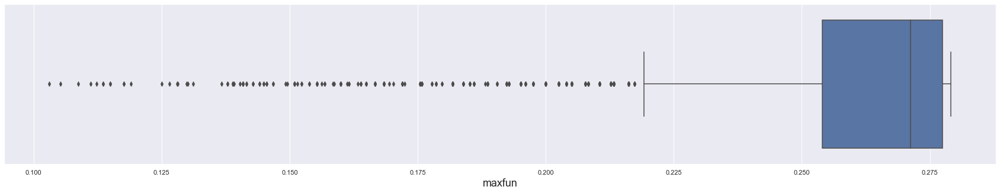

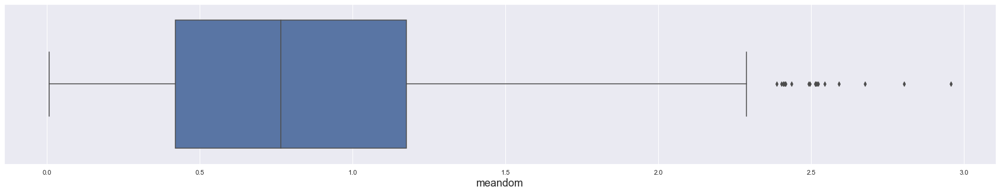

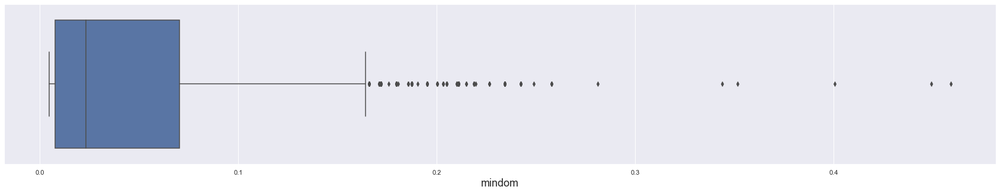

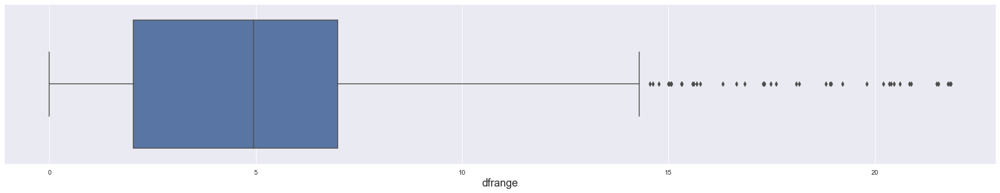

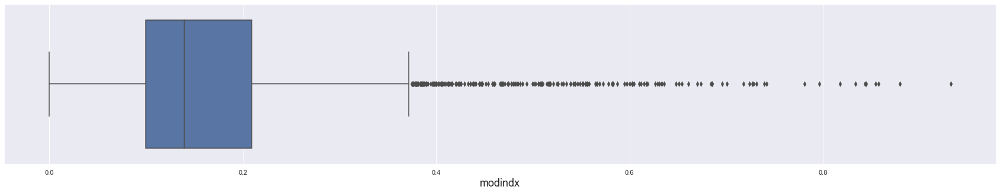

In [48]:
df_num_feat = df_gender.drop('label',axis=1)
for column in enumerate(df_num_feat):
    plt.figure(figsize=(30,5))
    sns.set_theme(style="darkgrid")
    sns.boxplot(x=column[1], data=  df_num_feat)
    plt.xlabel(column[1],fontsize=18)
    plt.show()

### 5.1.2 Removal of Outliers<a id='rem_out'></a>

**Checking the normality of numeric features**

In [49]:
from scipy.stats import shapiro

stat, p_value = shapiro(df_num_feat)

# print the test statistic and corresponding p-value 
print('Test statistic:', stat)
print('P-Value:', p_value)

Test statistic: 0.3519359827041626
P-Value: 0.0


Since the numeric features are not normally distributed, we are removing the outliers using IQR method

In [50]:
df_iqr = df_gender[~((df_gender < (Q1 - 1.5 * IQR)) |(df_gender > (Q3 + 1.5 * IQR))).any(axis=1)]
df_iqr.shape

(2222, 18)

In [51]:
df_iqr.reset_index(inplace=True)

In [52]:
df_iqr.drop(['index'],inplace=True,axis=1)

In [53]:
df_iqr.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx,label
0,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,0.963322,0.727232,0.083878,0.088965,0.017798,0.250000,0.201497,0.007812,0.554688,0.247119,male
1,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,0.971955,0.783568,0.104261,0.106398,0.016931,0.266667,0.712812,0.007812,5.476562,0.208274,male
2,0.132786,0.079557,0.119090,0.067958,0.209592,0.141634,1.932562,0.963181,0.738307,0.112555,0.110132,0.017112,0.253968,0.298222,0.007812,2.718750,0.125160,male
3,0.150762,0.074463,0.160106,0.092899,0.205718,0.112819,1.530643,0.967573,0.762638,0.086197,0.105945,0.026230,0.266667,0.479620,0.007812,5.304688,0.123992,male
4,0.142239,0.078018,0.138587,0.088206,0.208587,0.120381,1.099746,0.970723,0.770992,0.219103,0.096729,0.017957,0.250000,0.336476,0.007812,2.156250,0.148272,male


### 5.1.3 Rechecking for Correlation <a id='rec_cor'></a>

In [54]:
data_num_features = df_iqr.select_dtypes(include=np.number)

# print the names of the numeric variables 
print('The numerical columns in the dataset are: ',data_num_features.columns)

The numerical columns in the dataset are:  Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'sp.ent',
       'sfm', 'mode', 'meanfun', 'minfun', 'maxfun', 'meandom', 'mindom',
       'dfrange', 'modindx'],
      dtype='object')


In [55]:
corr =  data_num_features.corr()

# print the correlation matrix
corr

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx
meanfreq,1.000000,-0.725550,0.901230,0.898333,0.679364,-0.619251,0.000764,-0.771403,-0.841597,0.574807,0.474069,0.442622,0.323430,0.462647,0.094747,0.467408,-0.326280
sd,-0.725550,1.000000,-0.515612,-0.827454,-0.059120,0.862388,-0.193323,0.867297,0.875670,-0.381551,-0.460194,-0.333347,-0.108362,-0.401107,-0.266485,-0.441669,0.303340
median,0.901230,-0.515612,1.000000,0.726477,0.669531,-0.438879,-0.056024,-0.615408,-0.688245,0.605773,0.435718,0.408053,0.298272,0.388009,0.070551,0.378507,-0.255034
Q25,0.898333,-0.827454,0.726477,1.000000,0.386542,-0.879848,0.218825,-0.818383,-0.805283,0.419753,0.573260,0.290179,0.207072,0.372965,0.146083,0.403486,-0.270170
Q75,0.679364,-0.059120,0.669531,0.386542,1.000000,0.098217,-0.287558,-0.228488,-0.368467,0.424297,0.118845,0.340440,0.356769,0.291967,-0.120381,0.256200,-0.203532
IQR,-0.619251,0.862388,-0.438879,-0.879848,0.098217,1.000000,-0.384301,0.765323,0.679055,-0.234284,-0.557327,-0.137682,-0.039592,-0.251989,-0.219662,-0.303354,0.186641
skew,0.000764,-0.193323,-0.056024,0.218825,-0.287558,-0.384301,1.000000,-0.379129,-0.136295,-0.233349,0.257051,-0.173802,-0.135289,-0.135040,0.056769,-0.087998,0.085880
sp.ent,-0.771403,0.867297,-0.615408,-0.818383,-0.228488,0.765323,-0.379129,1.000000,0.896021,-0.388085,-0.563735,-0.379704,-0.147429,-0.364717,-0.197625,-0.421981,0.298215
sfm,-0.841597,0.875670,-0.688245,-0.805283,-0.368467,0.679055,-0.136295,0.896021,1.000000,-0.441905,-0.400888,-0.412631,-0.195006,-0.405044,-0.219197,-0.434022,0.335739
mode,0.574807,-0.381551,0.605773,0.419753,0.424297,-0.234284,-0.233349,-0.388085,-0.441905,1.000000,0.235521,0.435865,0.197449,0.392597,0.094140,0.398089,-0.310522


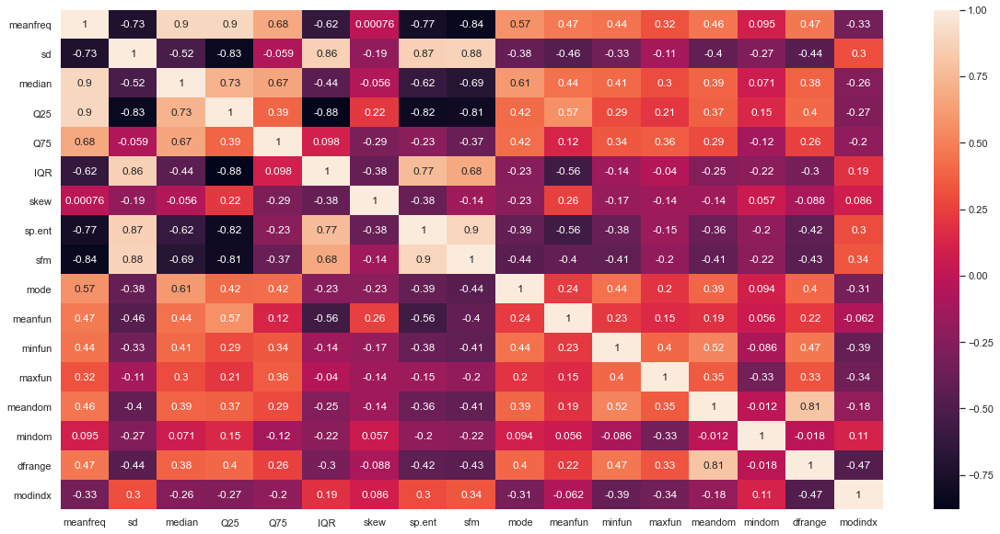

In [56]:
plt.figure(figsize=(20,10))
corr =data_num_features.corr(method='pearson')
sns.heatmap(corr, annot=True)
plt.show()

There are slight changes with respect to the correlation between numeric values.

## 5.2 Categorical Encoding<a id='cat_enc'></a>

**Filter the numeric and categorical features**

In [57]:
df_num = df_iqr.select_dtypes(include=np.number)
df_cat = df_iqr.select_dtypes(include=np.object)

In [58]:
df_cat.replace({'label':{'female':1, 'male':0}}, inplace = True)

In [59]:
df_cat.head()

,label
0,0
1,0
2,0
3,0
4,0


In [60]:
df_cat['label'].value_counts()

0    1116
1    1106
Name: label, dtype: int64

**Saving file for deployment**

In [210]:
file = pd.concat([df_num,df_cat],axis=1)

In [211]:
file.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx,label
0,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,0.963322,0.727232,0.083878,0.088965,0.017798,0.250000,0.201497,0.007812,0.554688,0.247119,0
1,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,0.971955,0.783568,0.104261,0.106398,0.016931,0.266667,0.712812,0.007812,5.476562,0.208274,0
2,0.132786,0.079557,0.119090,0.067958,0.209592,0.141634,1.932562,0.963181,0.738307,0.112555,0.110132,0.017112,0.253968,0.298222,0.007812,2.718750,0.125160,0
3,0.150762,0.074463,0.160106,0.092899,0.205718,0.112819,1.530643,0.967573,0.762638,0.086197,0.105945,0.026230,0.266667,0.479620,0.007812,5.304688,0.123992,0
4,0.142239,0.078018,0.138587,0.088206,0.208587,0.120381,1.099746,0.970723,0.770992,0.219103,0.096729,0.017957,0.250000,0.336476,0.007812,2.156250,0.148272,0


In [212]:
file.shape

(2222, 18)

In [213]:
file.to_csv('voice_recognition.csv',index=0)

# 6. Building Logistic Regression Models<a id='bui_log_mod'></a>

In [61]:
df_num.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx
0,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,0.963322,0.727232,0.083878,0.088965,0.017798,0.250000,0.201497,0.007812,0.554688,0.247119
1,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,0.971955,0.783568,0.104261,0.106398,0.016931,0.266667,0.712812,0.007812,5.476562,0.208274
2,0.132786,0.079557,0.119090,0.067958,0.209592,0.141634,1.932562,0.963181,0.738307,0.112555,0.110132,0.017112,0.253968,0.298222,0.007812,2.718750,0.125160
3,0.150762,0.074463,0.160106,0.092899,0.205718,0.112819,1.530643,0.967573,0.762638,0.086197,0.105945,0.026230,0.266667,0.479620,0.007812,5.304688,0.123992
4,0.142239,0.078018,0.138587,0.088206,0.208587,0.120381,1.099746,0.970723,0.770992,0.219103,0.096729,0.017957,0.250000,0.336476,0.007812,2.156250,0.148272


In [62]:
df_num.isnull().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
sp.ent      0
sfm         0
mode        0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
dfrange     0
modindx     0
dtype: int64

In [63]:
df_num.shape

(2222, 17)

## 6.1 Logistic Regression - Basic Model<a id='bas_mod'></a>

In [64]:
X = df_num.drop(['IQR'],axis=1)
y = df_cat['label']

Dropping IQR, as we already have Q25 and Q75 columns.

In [65]:
X = sm.add_constant(X)
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state = 10, test_size = 0.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)

# print dimension of test set
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (1777, 17)
y_train (1777,)
X_test (445, 17)
y_test (445,)


In [66]:
logreg = sm.Logit(y_train, X_train).fit()

# print the summary of the model
print(logreg.summary())

Optimization terminated successfully.
         Current function value: 0.095532
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                  label   No. Observations:                 1777
Model:                          Logit   Df Residuals:                     1760
Method:                           MLE   Df Model:                           16
Date:                Tue, 15 Jun 2021   Pseudo R-squ.:                  0.8622
Time:                        10:50:37   Log-Likelihood:                -169.76
converged:                       True   LL-Null:                       -1231.7
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.9727     14.753      0.676      0.499     -18.943      38.889
meanfreq     -98.7469     66

While the LLR p-value is less than 0.05, we are getting a message about quasi-separation, which indicates that one or more variables of X are affecting the predictor variable `Label`. Hence, we will attempt to scale the variables in order to try and fix it.

## 6.2 Feature Transformation<a id='fea_tra'></a>

In [67]:
df_num.skew()

meanfreq   -0.294220
sd          0.060485
median     -0.574318
Q25        -0.290346
Q75        -0.265662
IQR         0.154952
skew        0.627441
sp.ent     -0.389060
sfm         0.477611
mode       -1.078901
meanfun     0.096910
minfun     -0.297858
maxfun     -1.718578
meandom     0.357969
mindom      2.168044
dfrange     0.009238
modindx     1.113603
dtype: float64

Since the skewness is relatively low, there is no need to perform any further transformations to reduce skewness

## 6.3 Feature Scaling<a id='fea_sca'></a>

In [68]:
for col in df_num.columns:
    print("Column ", col, " :", stats.shapiro(df_num[col]))

Column  meanfreq  : ShapiroResult(statistic=0.9832666516304016, pvalue=1.7155675082372959e-15)
Column  sd  : ShapiroResult(statistic=0.9626927375793457, pvalue=1.6784904291584125e-23)
Column  median  : ShapiroResult(statistic=0.972251832485199, pvalue=2.4633912008859395e-20)
Column  Q25  : ShapiroResult(statistic=0.9869576096534729, pvalue=2.2799757958338884e-13)
Column  Q75  : ShapiroResult(statistic=0.9784085750579834, pvalue=7.640390212647111e-18)
Column  IQR  : ShapiroResult(statistic=0.942524254322052, pvalue=1.4467089815276236e-28)
Column  skew  : ShapiroResult(statistic=0.971734344959259, pvalue=1.588731713642075e-20)
Column  sp.ent  : ShapiroResult(statistic=0.9787000417709351, pvalue=1.0305371758849017e-17)
Column  sfm  : ShapiroResult(statistic=0.9575669169425964, pvalue=5.90300671072357e-25)
Column  mode  : ShapiroResult(statistic=0.9021716117858887, pvalue=1.61234317866513e-35)
Column  meanfun  : ShapiroResult(statistic=0.9762130975723267, pvalue=8.754164092031387e-19)
Colu

Since none of the numerical features are normally distributed (p-value<0.05) , we will perform Min-Max normalisation to scale the data

In [69]:
mms = preprocessing.MinMaxScaler()
mmsfit = mms.fit(df_num)
df_scaled = pd.DataFrame(mms.fit_transform(df_num), columns = df_num.columns)

In [70]:
df_scaled.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,dfrange,modindx
0,0.278988,0.679965,0.325085,0.337038,0.406321,0.529713,0.212981,0.935673,0.867095,0.299565,0.115124,0.098249,0.514249,0.064920,0.018405,0.034047,0.648345
1,0.162728,0.775019,0.106976,0.258496,0.389010,0.618856,0.183397,0.977709,0.942827,0.372362,0.227895,0.087639,0.792324,0.294406,0.018405,0.380011,0.537513
2,0.145882,0.780568,0.070577,0.211171,0.421150,0.698820,0.370217,0.934986,0.881983,0.401984,0.252050,0.089857,0.580457,0.108332,0.018405,0.186161,0.300375
3,0.275626,0.711750,0.338786,0.320844,0.386049,0.537792,0.279902,0.956371,0.914690,0.307846,0.224963,0.201514,0.792324,0.189746,0.018405,0.367930,0.297044
4,0.214110,0.759784,0.198073,0.300209,0.412050,0.580052,0.183076,0.971709,0.925921,0.782511,0.165349,0.100206,0.514249,0.125501,0.018405,0.146623,0.366319


## 6.4 Logistic Regression - Full Model - After Feature Scaling<a id='mod_aft_sca'></a>

In [71]:
X=df_scaled.drop('IQR',axis=1)
X = sm.add_constant(X)
y = df_cat['label']

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state = 10, test_size = 0.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)

# print dimension of test set
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (1777, 17)
y_train (1777,)
X_test (445, 17)
y_test (445,)


In [73]:
logreg_full = sm.Logit(y_train, X_train).fit()

# print the summary of the model
print(logreg_full.summary())

Optimization terminated successfully.
         Current function value: 0.095532
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                  label   No. Observations:                 1777
Model:                          Logit   Df Residuals:                     1760
Method:                           MLE   Df Model:                           16
Date:                Tue, 15 Jun 2021   Pseudo R-squ.:                  0.8622
Time:                        10:50:37   Log-Likelihood:                -169.76
converged:                       True   LL-Null:                       -1231.7
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -9.6710      3.322     -2.911      0.004     -16.182      -3.160
meanfreq     -13.6813      9

Even after scaling, we get the same message that one or more independent variables are affecting the predictor. Hence, we proceed to feature selection to pick best features for our model.

## 6.5 Feature Selection<a id="fea_sel"></a>

### 6.5.1 Forward Selection<a id="for_sel"></a>

In [74]:
logreg3 = LogisticRegression()
logreg_forward = sfs(estimator=logreg3, k_features ='best', forward=True,
                     verbose=0, scoring='accuracy')

# fit the forward selection on training data using fit()
sfs_forward = logreg_forward.fit(X_train, y_train)

In [75]:
print('Features selected using forward selection are: ')
print(sfs_forward.k_feature_names_)

# print the R-squared value
print('\naccuracy: ', sfs_forward.k_score_)

Features selected using forward selection are: 
('median', 'Q25', 'Q75', 'meanfun', 'minfun', 'maxfun')

accuracy:  0.9701693305902832


### 6.5.2 Backward Elimination<a id="bac_eli"></a>

In [76]:
logreg4 = LogisticRegression()
logreg_backward = sfs(estimator = logreg4, k_features ='best', forward = False,
                     verbose = 0, scoring = 'accuracy')

# fit the backward elimination on training data using fit()
sfs_backward = logreg_backward.fit(X_train, y_train)

In [77]:
print('Features selected using backward elimination are: ')
print(sfs_backward.k_feature_names_)

# print the R-squared value
print('\naccuracy: ', sfs_backward.k_score_)

Features selected using backward elimination are: 
('meanfreq', 'Q75', 'meanfun', 'minfun', 'modindx')

accuracy:  0.9696043677797119


We get a slightly higher accuracy from forward selection. We will now build a model using those features.

## 6.6 Logistic Regression - Full Model - After Feature Selection<a id="mod_fea_sel"></a>

In [78]:
X=df_scaled[['median', 'Q25', 'Q75', 'meanfun', 'minfun', 'maxfun']]
X = sm.add_constant(X)
y = df_cat['label']

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state = 10, test_size = 0.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)

# print dimension of test set
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (1777, 7)
y_train (1777,)
X_test (445, 7)
y_test (445,)


In [80]:
logreg_fs = sm.Logit(y_train, X_train).fit()

# print the summary of the model
print(logreg_fs.summary())

Optimization terminated successfully.
         Current function value: 0.100618
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                  label   No. Observations:                 1777
Model:                          Logit   Df Residuals:                     1770
Method:                           MLE   Df Model:                            6
Date:                Tue, 15 Jun 2021   Pseudo R-squ.:                  0.8548
Time:                        10:51:18   Log-Likelihood:                -178.80
converged:                       True   LL-Null:                       -1231.7
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.1649      1.109    -10.970      0.000     -14.338      -9.992
median        -0.6047      1.

<b>Interpretation</b>:We see that the quasi-separation message is gone, implying the predictor variable is no longer getting affected. Also, LLR p-value is less than 0.05, which indicates that the model is significant. Pseudo R-squared value is 0.854, which implies that it is giving 85% better performance with features when compared to the null model.

In [81]:
y_pred_fs = logreg_fs.predict(X_test)

In [82]:
y_pred_fs.head()

1359   0.999882
90     0.000173
1892   0.987410
2000   0.993993
1998   0.999037
dtype: float64

In [83]:
y_pred_new = [ 0 if x < 0.5 else 1 for x in y_pred_fs]

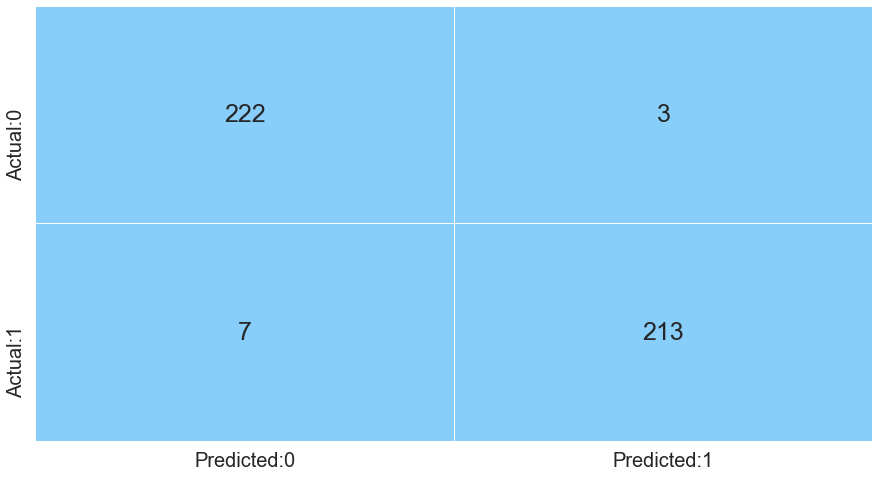

In [84]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm = confusion_matrix(y_test, y_pred_new)

# label the confusion matrix  
# pass the matrix as 'data'
# pass the required column names to the parameter, 'columns'
# pass the required row names to the parameter, 'index'
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

# plot a heatmap to visualize the confusion matrix
# 'annot' prints the value of each grid 
# 'fmt = d' returns the integer value in each grid
# 'cmap' assigns color to each grid
# as we do not require different colors for each grid in the heatmap,
# use 'ListedColormap' to assign the specified color to the grid
# 'cbar = False' will not return the color bar to the right side of the heatmap
# 'linewidths' assigns the width to the line that divides each grid
# 'annot_kws = {'size':25})' assigns the font size of the annotated text 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

In [85]:
# True Negatives are denoted by 'TN'
# Actual 'O' values which are classified correctly
TN = cm[0,0]

# True Positives are denoted by 'TP'
# Actual '1' values which are classified correctly
TP = cm[1,1]

# False Positives are denoted by 'FP'
# it is the type 1 error
# Actual 'O' values which are classified wrongly as '1'
FP = cm[0,1]

# False Negatives are denoted by 'FN'
# it is the type 2 error
# Actual '1' values which are classified wrongly as '0'
FN = cm[1,0]

In [86]:
accuracy = (TN+TP) / (TN+FP+FN+TP)

# print the accuracy
accuracy

0.9775280898876404

In [87]:
from sklearn.metrics import cohen_kappa_score

kappa = cohen_kappa_score(y_test, y_pred_new)

# print the kappa value
print('kappa value:',kappa)

kappa value: 0.9550414225095979


In [88]:
precision = TP / (TP+FP)

# print the value
precision

0.9861111111111112

In [89]:
recall = TP / (TP+FN)

# print the value
recall

0.9681818181818181

In [90]:
# calculate the f1_score
f1_score = 2*((precision*recall)/(precision+recall))

# print the f1_score
f1_score

0.9770642201834862

In [91]:
y_train_pred = logreg_fs.predict(X_train)
y_pred_train = [ 0 if x < 0.5 else 1 for x in y_train_pred]

In [92]:
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       891
           1       0.97      0.97      0.97       886

    accuracy                           0.97      1777
   macro avg       0.97      0.97      0.97      1777
weighted avg       0.97      0.97      0.97      1777



In [93]:
print(classification_report(y_test,y_pred_new))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       225
           1       0.99      0.97      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



Creating a score card to compare the metrics of different models

In [94]:
model_score_card = pd.DataFrame(columns=['Model Name', 'AUC Score', 'Precision Score', 'Recall Score',
                                       'Accuracy Score (Train)','Accuracy Score (Test)', 'f1-score'])

# append the result table for all performance scores
# performance measures considered for model comparision are 'AUC Score', 'Precision Score', 'Recall Score','Accuracy Score',
# 'Kappa Score', and 'f1-score'
# compile the required information in a user defined function 
def update_model_score_card(algorithm_name,model,cutoff):
    
    # let 'y_pred_prob' be the predicted values of y
    y_pred_prob = model.predict(X_test)
    y_pred_train = model.predict(X_train)

    # convert probabilities to 0 and 1 using 'if_else'
    y_pred = [ 0 if x < cutoff else 1 for x in y_pred_prob]
    y_train_pred = [0 if x < cutoff else 1 for x in y_pred_train]
    
    # assign 'score_card' as global variable
    global model_score_card

    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    model_score_card = model_score_card.append({'Model Name': algorithm_name,
                                    'AUC Score' : metrics.roc_auc_score(y_test, y_pred),
                                    'Precision Score': metrics.precision_score(y_test, y_pred),
                                    'Recall Score': metrics.recall_score(y_test, y_pred),
                                    'Accuracy Score (Train)': metrics.accuracy_score(y_train, y_train_pred),
                                    'Accuracy Score (Test)': metrics.accuracy_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)

In [95]:
from sklearn import metrics
update_model_score_card(algorithm_name = 'Logistic Regression with Feature Selection', model = logreg_fs, cutoff = 0.5)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064


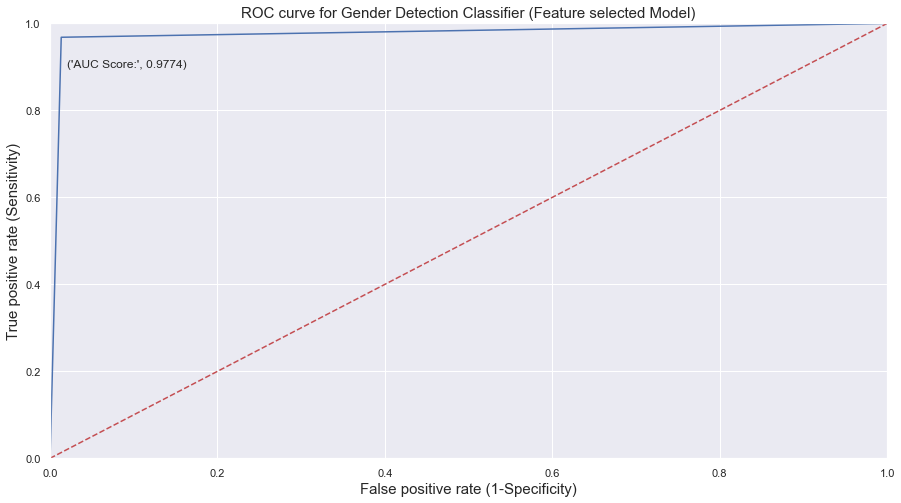

In [96]:
# the roc_curve() returns the values for false positive rate, true positive rate and threshold
# pass the actual target values and predicted probabilities to the function
fpr, tpr, thresholds = roc_curve(y_test, y_pred_new)

# plot the ROC curve
plt.plot(fpr, tpr)

# set limits for x and y axes
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

# plot the straight line showing worst prediction for the model
plt.plot([0, 1], [0, 1],'r--')

# add plot and axes labels
# set text size using 'fontsize'
plt.title('ROC curve for Gender Detection Classifier (Feature selected Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

# add the AUC score to the plot
# 'x' and 'y' gives position of the text
# 's' is the text 
# use round() to round-off the AUC score upto 4 digits
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_pred_new),4)))
                               
# plot the grid
plt.grid(True)

## 6.7 Selecting optimum cut-off value<a id="opt_cut_sel"></a>

Creating a user defined function to find the best probability cutoff value

In [97]:
score_card = pd.DataFrame(columns=['Probability Cutoff', 'AUC Score', 'Precision Score', 'Recall Score',
                                       'Accuracy Score', 'Kappa Score', 'f1-score'])

# append the result table for all performance scores
# performance measures considered for model comparision are 'AUC Score', 'Precision Score', 'Recall Score','Accuracy Score',
# 'Kappa Score', and 'f1-score'
# compile the required information in a user defined function 
def update_score_card(model, cutoff):
    
    # let 'y_pred_prob' be the predicted values of y
    y_pred_prob = model.predict(X_test)

    # convert probabilities to 0 and 1 using 'if_else'
    y_pred = [ 0 if x < cutoff else 1 for x in y_pred_prob]
    
    # assign 'score_card' as global variable
    global score_card

    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    score_card = score_card.append({'Probability Cutoff': cutoff,
                                    'AUC Score' : metrics.roc_auc_score(y_test, y_pred),
                                    'Precision Score': metrics.precision_score(y_test, y_pred),
                                    'Recall Score': metrics.recall_score(y_test, y_pred),
                                    'Accuracy Score': metrics.accuracy_score(y_test, y_pred),
                                    'Kappa Score':metrics.cohen_kappa_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)

In [98]:
cutoff = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# use the for loop to compute performance measures for each value of the cut-off
# call the update_score_card() to update the score card for each cut-off
# pass the model and cut-off value to the function
for value in cutoff:
    update_score_card(logreg_fs, value)

In [99]:
# print the score card 
print('Score Card for Logistic regression:')

# sort the dataframe based on the probability cut-off values ascending order
# 'reset_index' resets the index of the dataframe
# 'drop = True' drops the previous index
score_card = score_card.sort_values('Probability Cutoff').reset_index(drop = True)

# color the cell in the columns 'AUC Score', 'Accuracy Score', 'Kappa Score', 'f1-score' having maximum values
# 'style.highlight_max' assigns color to the maximum value
# pass specified color to the parameter, 'color'
# pass the data to limit the color assignment to the parameter, 'subset' 
score_card.style.highlight_max(color = 'lightblue', subset = ['AUC Score', 'Accuracy Score', 'Kappa Score', 'f1-score'])

Score Card for Logistic regression:


,Probability Cutoff,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,0.100000,0.948838,0.908714,0.995455,0.948315,0.896726,0.950108
1,0.200000,0.966515,0.947598,0.986364,0.966292,0.932606,0.966592
2,0.300000,0.977576,0.972973,0.981818,0.977528,0.955055,0.977376
3,0.400000,0.979747,0.981735,0.977273,0.979775,0.959543,0.979499
4,0.500000,0.977424,0.986111,0.968182,0.977528,0.955041,0.977064
5,0.600000,0.970556,0.990521,0.950000,0.970787,0.941539,0.969838
6,0.700000,0.966010,0.990431,0.940909,0.966292,0.932538,0.965035
7,0.800000,0.956919,0.990244,0.922727,0.957303,0.914531,0.955294
8,0.900000,0.934192,0.989744,0.877273,0.934831,0.869482,0.930120


We see that 0.4 has been selected as the best cut-off value

In [100]:
y_pred_cutoff = [ 0 if x < 0.4 else 1 for x in y_pred_fs]

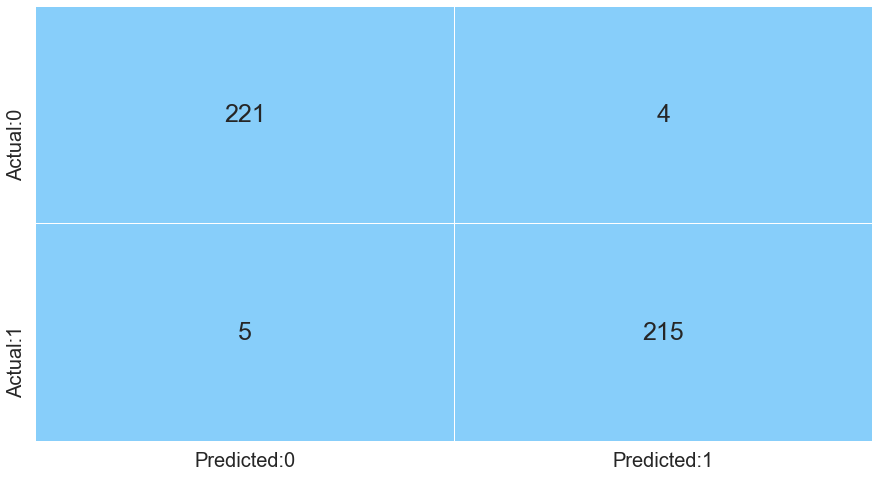

In [101]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm = confusion_matrix(y_test, y_pred_cutoff)

# label the confusion matrix  
# pass the matrix as 'data'
# pass the required column names to the parameter, 'columns'
# pass the required row names to the parameter, 'index'
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

# plot a heatmap to visualize the confusion matrix
# 'annot' prints the value of each grid 
# 'fmt = d' returns the integer value in each grid
# 'cmap' assigns color to each grid
# as we do not require different colors for each grid in the heatmap,
# use 'ListedColormap' to assign the specified color to the grid
# 'cbar = False' will not return the color bar to the right side of the heatmap
# 'linewidths' assigns the width to the line that divides each grid
# 'annot_kws = {'size':25})' assigns the font size of the annotated text 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

In [102]:
acc_table = classification_report(y_test, y_pred_cutoff)

# print the table
print(acc_table)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       225
           1       0.98      0.98      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



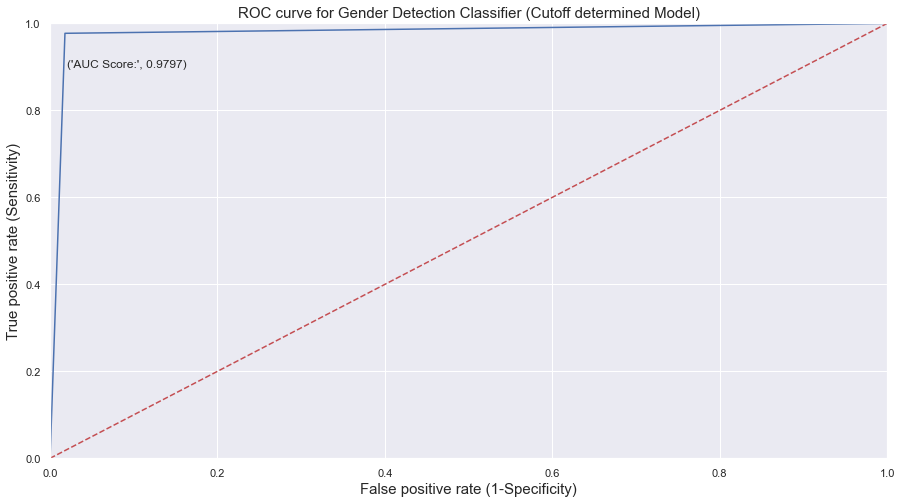

In [103]:
# the roc_curve() returns the values for false positive rate, true positive rate and threshold
# pass the actual target values and predicted probabilities to the function
fpr, tpr, thresholds = roc_curve(y_test, y_pred_cutoff)

# plot the ROC curve
plt.plot(fpr, tpr)

# set limits for x and y axes
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

# plot the straight line showing worst prediction for the model
plt.plot([0, 1], [0, 1],'r--')

# add plot and axes labels
# set text size using 'fontsize'
plt.title('ROC curve for Gender Detection Classifier (Cutoff determined Model)', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

# add the AUC score to the plot
# 'x' and 'y' gives position of the text
# 's' is the text 
# use round() to round-off the AUC score upto 4 digits
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_pred_cutoff),4)))
                               
# plot the grid
plt.grid(True)

In [104]:
update_model_score_card(algorithm_name = 'Logistic Regression with cutoff determined', model = logreg_fs, cutoff = 0.4)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499


# 7. Naive Bayes <a id = nai_bay></a>

In [105]:
X = df_scaled.drop('IQR',axis=1)
#X = sm.add_constant(X)
y = df_cat['label']

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state = 10, test_size = 0.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)

# print dimension of test set
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (1777, 17)
y_train (1777,)
X_test (445, 17)
y_test (445,)


In [107]:
mnb = MultinomialNB()

# fit the model using fit() on train data
mnb_model = mnb.fit(X_train, y_train)

Creating user defined functions to generate classification reports

In [108]:
# create a generalized function to calculate the metrics values for train set
def get_train_report(model):
    
    # for training set:
    # train_pred: prediction made by the model on the train dataset 'X_train'
    # y_train: actual values of the target variable for the train dataset

    # predict the output of the target variable from the train data 
    train_pred = model.predict(X_train)

    # return the performace measures on train set
    return(classification_report(y_train, train_pred))

In [109]:
# create a generalized function to calculate the metrics values for test set
def get_test_report(model):
    
    # for test set:
    # test_pred: prediction made by the model on the test dataset 'X_test'
    # y_test: actual values of the target variable for the test dataset

    # predict the output of the target variable from the test data 
    test_pred = model.predict(X_test)

    # return the classification report for test data
    return(classification_report(y_test, test_pred))

In [110]:
train_report = get_train_report(mnb_model)

# print the performace measures
print(train_report)

              precision    recall  f1-score   support

           0       0.79      0.88      0.83       891
           1       0.87      0.76      0.81       886

    accuracy                           0.82      1777
   macro avg       0.83      0.82      0.82      1777
weighted avg       0.83      0.82      0.82      1777



In [111]:
test_report = get_test_report(mnb_model)

# print the performace measures
print(test_report)

              precision    recall  f1-score   support

           0       0.78      0.91      0.84       225
           1       0.89      0.75      0.81       220

    accuracy                           0.83       445
   macro avg       0.84      0.83      0.83       445
weighted avg       0.83      0.83      0.83       445



Creating user defined function to plot ROC curve

In [112]:
# define a function to plot the ROC curve and print the ROC-AUC score
def plot_roc(model):
    
    # predict the probability of target variable using X_test
    # consider the probability of positive class by subsetting with '[:,1]'
    y_pred_prob = model.predict_proba(X_test)[:,1]
    
    # the roc_curve() returns the values for false positive rate, true positive rate and threshold
    # pass the actual target values and predicted probabilities to the function
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # plot the ROC curve
    plt.plot(fpr, tpr)

    # set limits for x and y axes
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])

    # plot the straight line showing worst prediction for the model
    plt.plot([0, 1], [0, 1],'r--')

    # add plot and axes labels
    # set text size using 'fontsize'
    plt.title('ROC curve for Gender Prediction Classifier', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

    # add the AUC score to the plot
    # 'x' and 'y' gives position of the text
    # 's' is the text 
    # use round() to round-off the AUC score upto 4 digits
    plt.text(x = 0.02, y = 0.9, s = ('AUC Score:',round(roc_auc_score(y_test, y_pred_prob),4)))

    # plot the grid
    plt.grid(True)

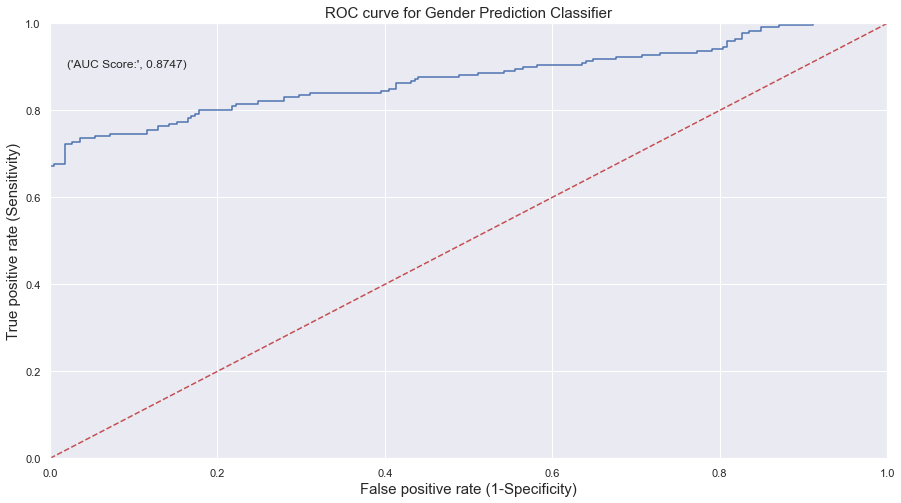

In [113]:
plot_roc(mnb_model)

Creating a user defined function to plot the confusion matrix

In [114]:
# define a to plot a confusion matrix for the model
def plot_confusion_matrix(model):
    
    # predict the target values using X_test
    y_pred = model.predict(X_test)
    
    # create a confusion matrix
    # pass the actual and predicted target values to the confusion_matrix()
    cm = confusion_matrix(y_test, y_pred)

    # label the confusion matrix  
    # pass the matrix as 'data'
    # pass the required column names to the parameter, 'columns'
    # pass the required row names to the parameter, 'index'
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

    # plot a heatmap to visualize the confusion matrix
    # 'annot' prints the value of each grid 
    # 'fmt = d' returns the integer value in each grid
    # 'cmap' assigns color to each grid
    # as we do not require different colors for each grid in the heatmap,
    # use 'ListedColormap' to assign the specified color to the grid
    # 'cbar = False' will not return the color bar to the right side of the heatmap
    # 'linewidths' assigns the width to the line that divides each grid
    # 'annot_kws = {'size':25})' assigns the font size of the annotated text 
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})

    # set the font size of x-axis ticks using 'fontsize'
    plt.xticks(fontsize = 20)

    # set the font size of y-axis ticks using 'fontsize'
    plt.yticks(fontsize = 20)

    # display the plot
    plt.show()

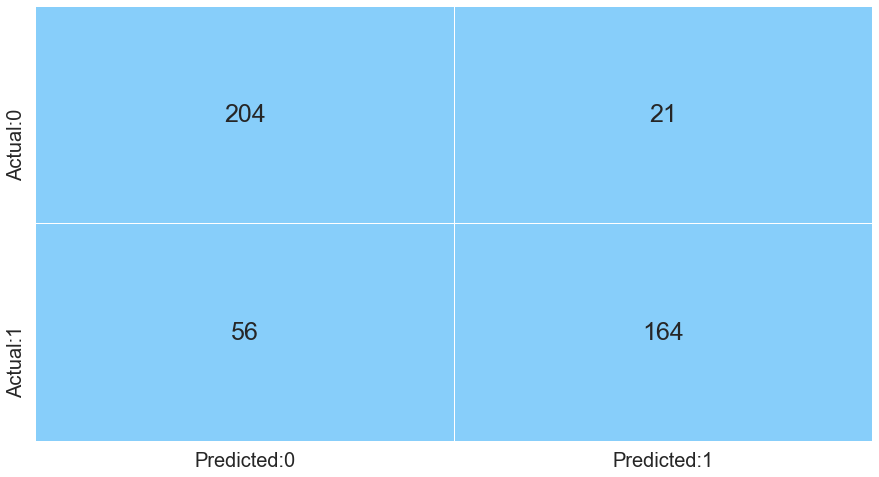

In [115]:
plot_confusion_matrix(mnb_model)

In [116]:
score = cross_val_score(mnb, X_train, y_train, cv = 10)
score = score.mean()

print("Accuracy after 10 fold cross validation: ", round(score, 2))

Accuracy after 10 fold cross validation:  0.82


In [117]:
def update_model_score_card(algorithm_name,model):
    
    # let 'y_pred_prob' be the predicted values of y
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    y_pred_prob = model.predict_proba(X_test)[:,1]
    
    # assign 'score_card' as global variable
    global model_score_card

    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    model_score_card = model_score_card.append({'Model Name': algorithm_name,
                                    'AUC Score' : metrics.roc_auc_score(y_test, y_pred_prob),
                                    'Precision Score': metrics.precision_score(y_test, y_pred),
                                    'Recall Score': metrics.recall_score(y_test, y_pred),
                                    'Accuracy Score (Train)': metrics.accuracy_score(y_train, y_train_pred),
                                    'Accuracy Score (Test)': metrics.accuracy_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)

In [118]:
update_model_score_card(algorithm_name = 'Multinomial Naive Bayes', model = mnb_model)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877


# 8. KNN <a id = 'knn'></a>

In [119]:
knn_classification = KNeighborsClassifier(n_neighbors = 5,p=2)
knn_model = knn_classification.fit(X_train, y_train)

In [120]:
train_report = get_train_report(knn_model)

# print the performace measures
print(train_report)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       891
           1       0.99      0.97      0.98       886

    accuracy                           0.98      1777
   macro avg       0.98      0.98      0.98      1777
weighted avg       0.98      0.98      0.98      1777



In [121]:
test_report = get_test_report(knn_model)

# print the performace measures
print(test_report)

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       225
           1       0.98      0.95      0.97       220

    accuracy                           0.97       445
   macro avg       0.97      0.97      0.97       445
weighted avg       0.97      0.97      0.97       445



**Tuning Hyperparameters**

In [122]:
tuned_paramaters = {'n_neighbors': np.arange(1, 25, 2),
                   'metric': ['hamming','euclidean','manhattan','Chebyshev']}
knn_classification = KNeighborsClassifier()
knn_grid = GridSearchCV(estimator = knn_classification, 
                        param_grid = tuned_paramaters, 
                        cv = 3, 
                        scoring = 'accuracy')

# fit the model on X_train and y_train using fit()
knn_grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for KNN Classifier: ', knn_grid.best_params_, '\n')

Best parameters for KNN Classifier:  {'metric': 'manhattan', 'n_neighbors': 3} 



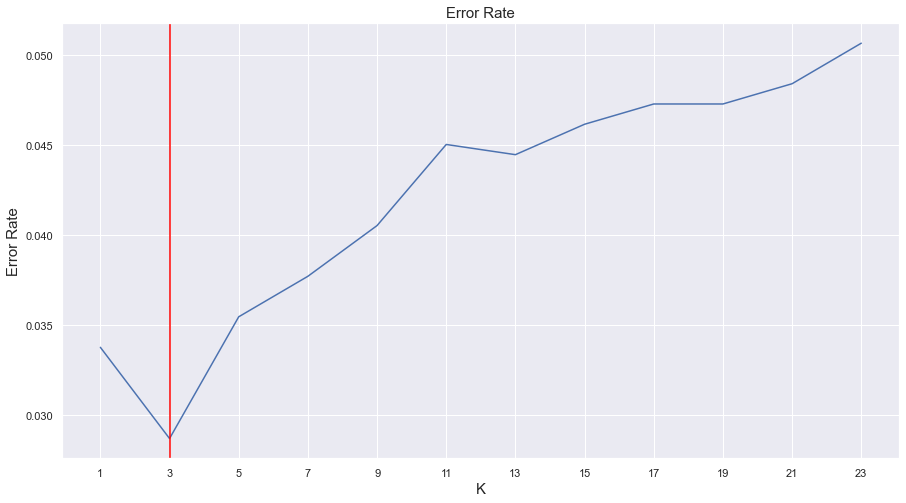

In [123]:
# consider an empty list to store error rate
error_rate = []

# use for loop to build a knn model for each K
for i in np.arange(1,25,2):
    knn = KNeighborsClassifier(i, metric = 'manhattan')

    score = cross_val_score(knn, X_train, y_train, cv = 3)
    
    # calculate the mean score
    score = score.mean()
    
    # compute error rate 
    error_rate.append(1 - score)

# plot the error_rate for different values of K 
plt.plot(range(1,25,2), error_rate)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Error Rate', fontsize = 15)
plt.xlabel('K', fontsize = 15)
plt.ylabel('Error Rate', fontsize = 15)

# set the x-axis labels
plt.xticks(np.arange(1, 25, step = 2))

# plot a vertical line across the minimum error rate
plt.axvline(x = 3, color = 'red')

# display the plot
plt.show()

In [124]:
knn_classification = KNeighborsClassifier(n_neighbors = 3,metric = 'manhattan')
knn_model1 = knn_classification.fit(X_train, y_train)

In [125]:
train_report = get_train_report(knn_model1)

# print the performace measures
print(train_report)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       891
           1       0.99      0.99      0.99       886

    accuracy                           0.99      1777
   macro avg       0.99      0.99      0.99      1777
weighted avg       0.99      0.99      0.99      1777



In [126]:
test_report = get_test_report(knn_model1)

# print the performace measures
print(test_report)

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       225
           1       0.99      0.98      0.99       220

    accuracy                           0.99       445
   macro avg       0.99      0.99      0.99       445
weighted avg       0.99      0.99      0.99       445



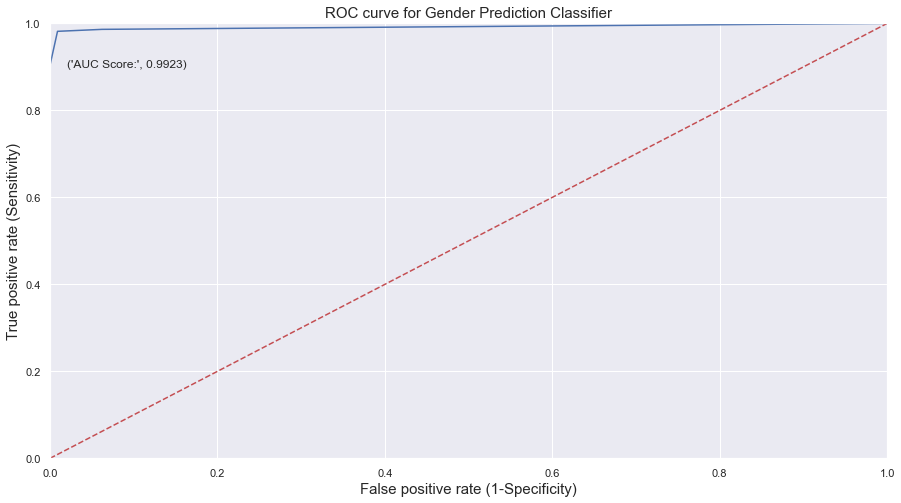

In [127]:
plot_roc(knn_model1)

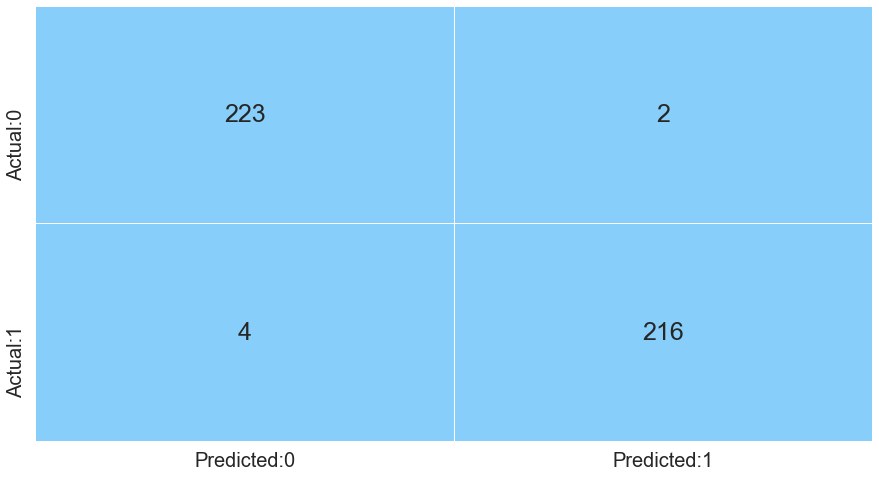

In [128]:
plot_confusion_matrix(knn_model1)

In [129]:
update_model_score_card(algorithm_name = 'K-Nearest Neighbours', model = knn_model1)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301


# 9. Decision Tree <a id = 'deci_tree'></a>

In [130]:
decision_tree_classification = DecisionTreeClassifier(criterion = 'entropy', random_state = 10)

# fit the model using fit() on train data
decision_tree = decision_tree_classification.fit(X_train, y_train)

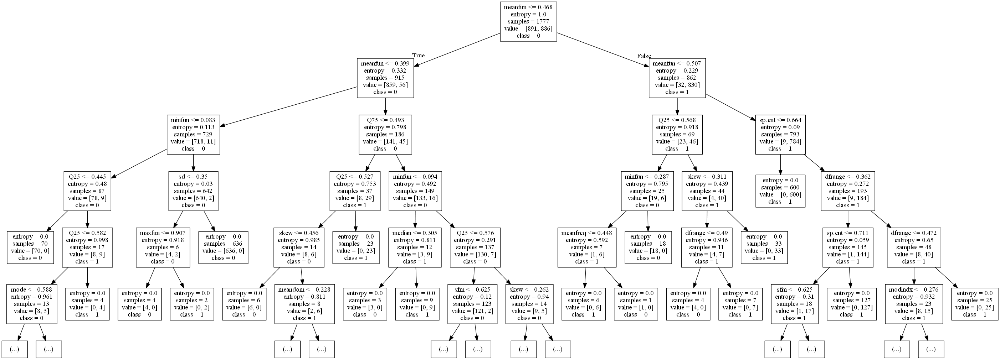

In [131]:
# save the column names in 'labels'
labels = X_train.columns

# export a decision tree in DOT format
# pass the 'decision_tree' to export it to Graphviz
# pass the column names to 'feature_names'
# pass the required class labels to 'class_names'
dot_data = tree.export_graphviz(decision_tree, feature_names = labels, class_names = ["0","1"],max_depth = 5)  

# plot the decision tree using DOT format in 'dot_data'
graph = pydotplus.graph_from_dot_data(dot_data)  

# display the decision tree
Image(graph.create_png())

# double-click on the image below to get an expanded view

In [132]:
print(get_train_report(decision_tree))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       891
           1       1.00      1.00      1.00       886

    accuracy                           1.00      1777
   macro avg       1.00      1.00      1.00      1777
weighted avg       1.00      1.00      1.00      1777



In [133]:
print(get_test_report(decision_tree))

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       225
           1       0.96      0.97      0.97       220

    accuracy                           0.97       445
   macro avg       0.97      0.97      0.97       445
weighted avg       0.97      0.97      0.97       445



**Finding important features according to DecisionTreeClassifier**

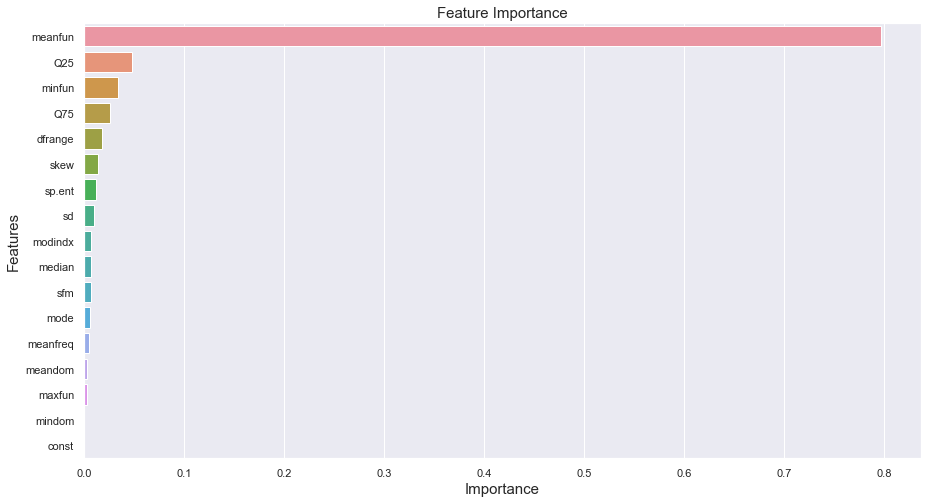

In [134]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': decision_tree.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

**Tuning Hyperparameters**

In [135]:
tuned_paramaters = [{'criterion': ['entropy', 'gini'], 
                     'max_depth': range(2, 10),
                     'min_samples_split': range(2,10)}]
 
# instantiate the 'DecisionTreeClassifier' 
# pass the 'random_state' to obtain the same samples for each time you run the code
decision_tree_classification = DecisionTreeClassifier(random_state = 10)

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the decision tree classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 5
tree_grid = GridSearchCV(estimator = decision_tree_classification, 
                         param_grid = tuned_paramaters, 
                         cv = 5)

# fit the model on X_train and y_train using fit()
tree_grid_model = tree_grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')

Best parameters for decision tree classifier:  {'criterion': 'entropy', 'max_depth': 6, 'min_samples_split': 4} 



In [136]:
dt_model = DecisionTreeClassifier(criterion = tree_grid_model.best_params_.get('criterion'),
                                  max_depth = tree_grid_model.best_params_.get('max_depth'),
                                  min_samples_split = tree_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)

# use fit() to fit the model on the train set
dt_model = dt_model.fit(X_train, y_train)

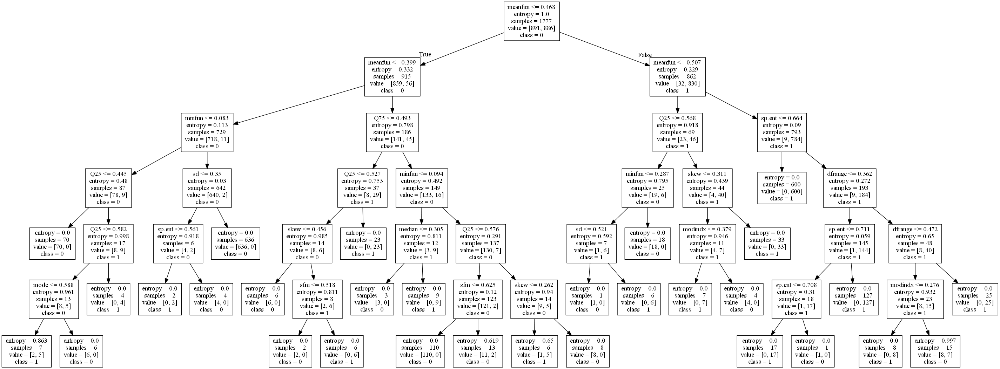

In [137]:
# save the column names in 'labels'
labels = X_train.columns

# export a decision tree in DOT format
# pass the 'dt_model' to export it to Graphviz
# pass the column names to 'feature_names'
# pass the required class labels to 'class_names'
dot_data = tree.export_graphviz(dt_model, feature_names = labels, class_names = ["0","1"])  

# plot the decision tree using DOT format in 'dot_data'
graph = pydotplus.graph_from_dot_data(dot_data)  

# display the decision tree
Image(graph.create_png())

# double-click on the image below to get an expanded view

In [138]:
scores = cross_val_score(estimator = DecisionTreeClassifier(),
                                X = X_train,
                                y = y_train,
                                cv = 10,
                                scoring = 'accuracy')

In [139]:
print('All scores: ', scores)

print("\nMinimum score obtained: ", round(min(scores), 4))

print("Maximum score obtained: ", round(max(scores), 4))

print("Average score obtained: ", round(np.mean(scores), 4))

All scores:  [0.9494382  0.94382022 0.95505618 0.96067416 0.98876404 0.95505618
 0.98314607 0.96610169 0.96610169 0.95480226]

Minimum score obtained:  0.9438
Maximum score obtained:  0.9888
Average score obtained:  0.9623


In [140]:
print(get_train_report(dt_model))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       891
           1       1.00      0.99      0.99       886

    accuracy                           0.99      1777
   macro avg       0.99      0.99      0.99      1777
weighted avg       0.99      0.99      0.99      1777



In [141]:
print(get_test_report(dt_model))

              precision    recall  f1-score   support

           0       0.97      0.96      0.96       225
           1       0.96      0.97      0.96       220

    accuracy                           0.96       445
   macro avg       0.96      0.96      0.96       445
weighted avg       0.96      0.96      0.96       445



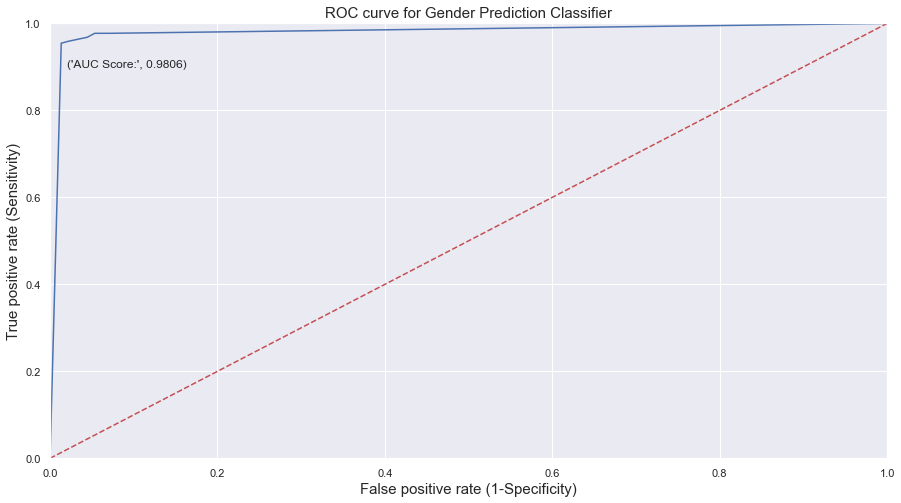

In [142]:
plot_roc(dt_model)

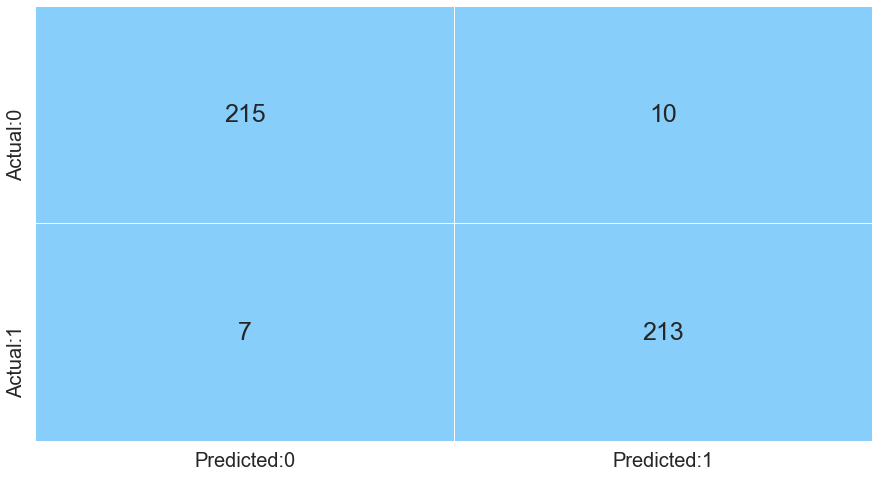

In [143]:
plot_confusion_matrix(dt_model)

In [144]:
update_model_score_card(algorithm_name = 'Decision Tree Classifier', model = dt_model)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625


# 10. Random Forest <a id = 'rnd_frst'></a>

In [145]:
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)

# use fit() to fit the model on the train set
rf_model = rf_classification.fit(X_train, y_train)

In [146]:
print(get_train_report(rf_model))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       891
           1       1.00      1.00      1.00       886

    accuracy                           1.00      1777
   macro avg       1.00      1.00      1.00      1777
weighted avg       1.00      1.00      1.00      1777



In [147]:
print(get_test_report(rf_model))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       225
           1       0.99      0.97      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



**Tuning Hyperparameters**

In [148]:
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators': [10, 30, 50, 70, 90],
                     'max_depth': [2,3,4,5,6,7,8,9,10],
                     'min_samples_split': [2, 5, 8, 11]}]
 
# instantiate the 'RandomForestClassifier' 
# pass the 'random_state' to obtain the same samples for each time you run the code
random_forest_classification = RandomForestClassifier(random_state = 10)

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the random forest classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 5
rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)

# use fit() to fit the model on the train set
rf_grid_model = rf_grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 8, 'n_estimators': 30} 



In [149]:
rf_model = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
                                  n_estimators = rf_grid_model.best_params_.get('n_estimators'),
                                  max_depth = rf_grid_model.best_params_.get('max_depth'),
                                  min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)

# use fit() to fit the model on the train set
rf_model = rf_model.fit(X_train, y_train)

In [150]:
print(get_train_report(rf_model))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       891
           1       0.99      0.99      0.99       886

    accuracy                           0.99      1777
   macro avg       0.99      0.99      0.99      1777
weighted avg       0.99      0.99      0.99      1777



In [151]:
print(get_test_report(rf_model))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       225
           1       0.99      0.97      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



In [152]:
scores = cross_val_score(estimator = RandomForestClassifier(),
                                X = X_train,
                                y = y_train,
                                cv = 10,
                                scoring = 'accuracy')

In [153]:
print('All scores: ', scores)

print("\nMinimum score obtained: ", round(min(scores), 4))

print("Maximum score obtained: ", round(max(scores), 4))

print("Average score obtained: ", round(np.mean(scores), 4))

All scores:  [0.97752809 0.97752809 0.95505618 0.98314607 0.98314607 0.96629213
 0.98876404 0.97175141 0.95480226 0.96610169]

Minimum score obtained:  0.9548
Maximum score obtained:  0.9888
Average score obtained:  0.9724


**Features deemed important by Random Forest Classifier**

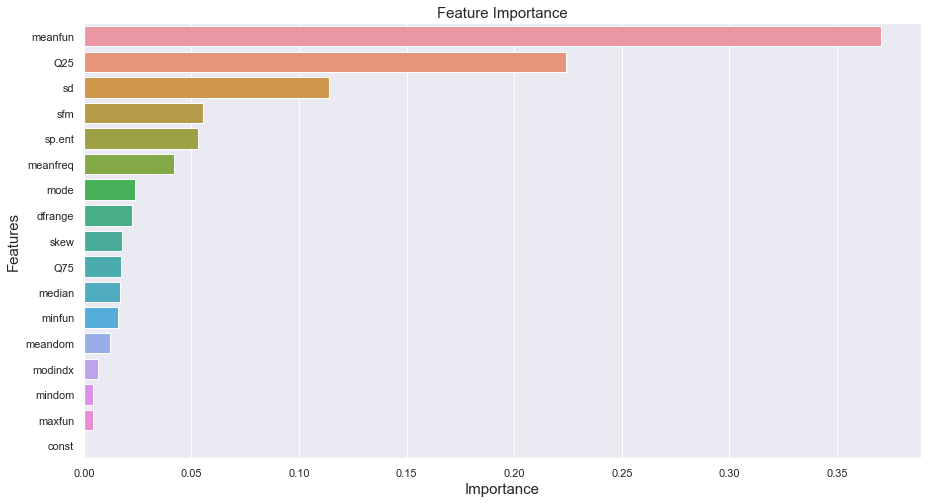

In [154]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': rf_model.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

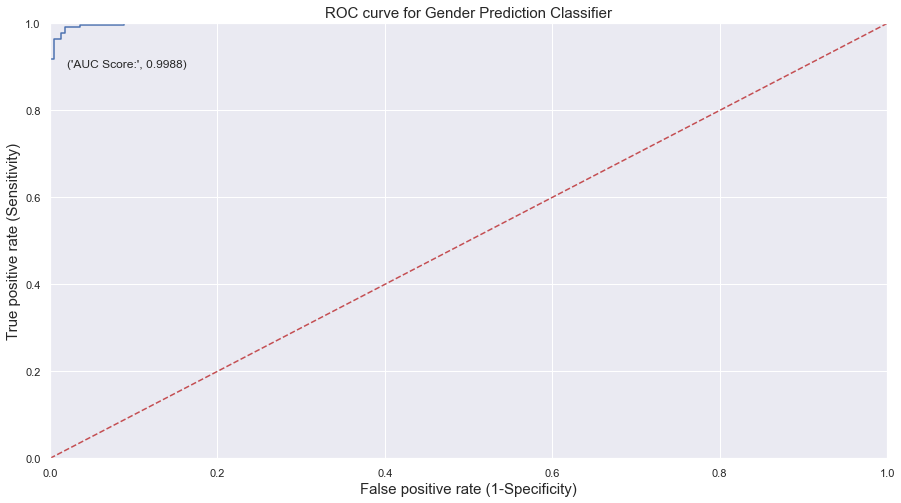

In [155]:
plot_roc(rf_model)

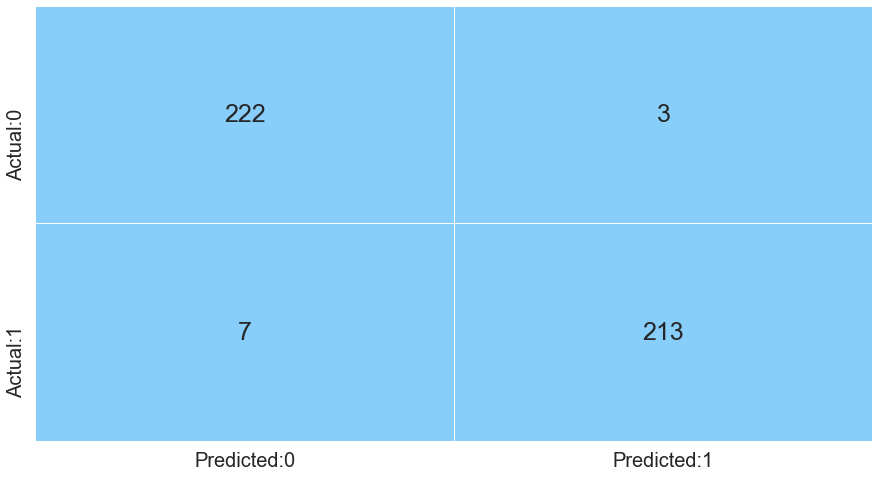

In [156]:
plot_confusion_matrix(rf_model)

In [157]:
update_model_score_card(algorithm_name = 'Random Forest Classifier', model = rf_model)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064


# 11. AdaBoost <a id = 'ada_boost'></a>

In [158]:
ada_model = AdaBoostClassifier(n_estimators = 40, random_state = 10)

# fit the model using fit() on train data
ada_model.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=40, random_state=10)

In [159]:
print(get_train_report(ada_model))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       891
           1       0.99      0.99      0.99       886

    accuracy                           0.99      1777
   macro avg       0.99      0.99      0.99      1777
weighted avg       0.99      0.99      0.99      1777



In [160]:
test_report = get_test_report(ada_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       225
           1       0.99      0.97      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



**Tuning Hyperparameters**

In [161]:
tuning_parameters = {'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
                     'n_estimators': range(10,100,10)}

# instantiate the 'AdaBoostClassifier' 
ada_model = AdaBoostClassifier()

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the AdaBoost classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 3
# scoring: pass a measure to evaluate the model on test set
ada_grid = GridSearchCV(estimator = ada_model, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc')

# fit the model on X_train and y_train using fit()
ada_grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for AdaBoost classifier: ', ada_grid.best_params_, '\n')

Best parameters for AdaBoost classifier:  {'learning_rate': 0.1, 'n_estimators': 80} 



In [162]:
ada_grid_model = AdaBoostClassifier(learning_rate = ada_grid.best_params_.get('learning_rate'),
                               n_estimators = ada_grid.best_params_.get('n_estimators'))

ada_model = ada_grid_model.fit(X_train, y_train)

In [163]:
print(get_train_report(ada_model))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       891
           1       0.98      0.96      0.97       886

    accuracy                           0.97      1777
   macro avg       0.97      0.97      0.97      1777
weighted avg       0.97      0.97      0.97      1777



In [164]:
test_report = get_test_report(ada_model)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       225
           1       0.99      0.96      0.97       220

    accuracy                           0.97       445
   macro avg       0.97      0.97      0.97       445
weighted avg       0.97      0.97      0.97       445



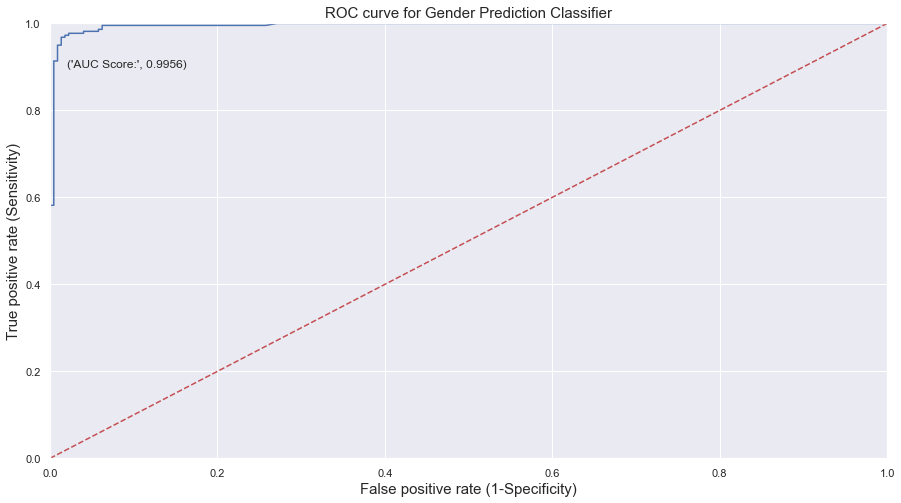

In [165]:
plot_roc(ada_model)

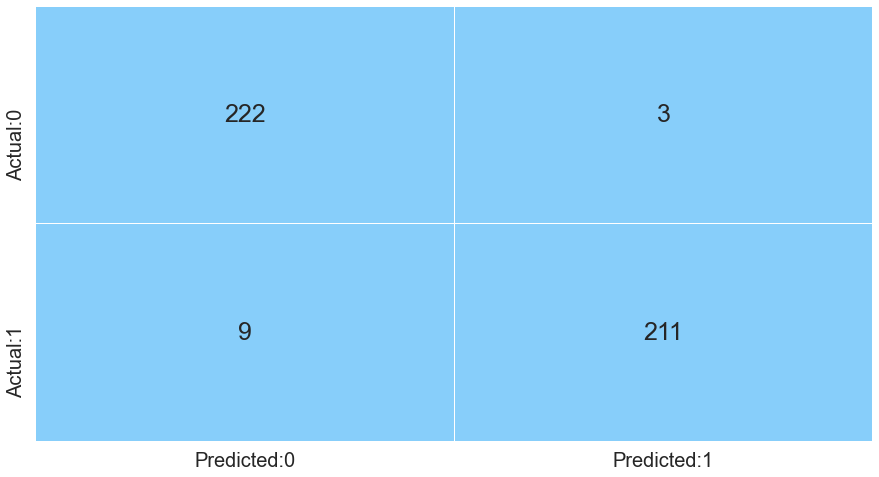

In [166]:
plot_confusion_matrix(ada_model)

In [167]:
scores = cross_val_score(estimator = AdaBoostClassifier(),
                                X = X_train,
                                y = y_train,
                                cv = 10,
                                scoring = 'accuracy')

In [168]:
print('All scores: ', scores)

print("\nMinimum score obtained: ", round(min(scores), 4))

print("Maximum score obtained: ", round(max(scores), 4))

print("Average score obtained: ", round(np.mean(scores), 4))

All scores:  [0.9494382  0.97191011 0.96629213 0.97752809 0.97752809 0.96067416
 1.         0.97175141 0.96045198 0.96045198]

Minimum score obtained:  0.9494
Maximum score obtained:  1.0
Average score obtained:  0.9696


In [169]:
update_model_score_card(algorithm_name = 'AdaBoost Classifier', model = ada_model)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350


# 12. Gradient Boost <a id = 'grd_boost'></a>

In [170]:
gboost_model = GradientBoostingClassifier(n_estimators = 100, max_depth = 3, random_state = 10)

# fit the model using fit() on train data
gboost_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=10)

In [171]:
print(get_train_report(gboost_model))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       891
           1       1.00      1.00      1.00       886

    accuracy                           1.00      1777
   macro avg       1.00      1.00      1.00      1777
weighted avg       1.00      1.00      1.00      1777



In [172]:
print(get_test_report(gboost_model))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       225
           1       0.99      0.98      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



**Tuning Hyperparameters**

In [174]:
tuning_parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
                     'n_estimators': [10,20,30,40,50,60,70,80,90,100],
                     'max_depth': [1,2,3,4,5,6,7,8,9,10]}

# instantiate the 'GradientBoostClassifier' 
gboost_model = GradientBoostingClassifier()

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the GradientBoost classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 3
# scoring: pass a measure to evaluate the model on test set
gboost_grid = GridSearchCV(estimator = gboost_model, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc')

# fit the model on X_train and y_train using fit()
gboost_grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for GradientBoost classifier: ', gboost_grid.best_params_, '\n')

Best parameters for GradientBoost classifier:  {'learning_rate': 0.9, 'max_depth': 4, 'n_estimators': 100} 



In [175]:
gboost_grid_model = GradientBoostingClassifier(learning_rate = gboost_grid.best_params_.get('learning_rate'),
                               n_estimators = gboost_grid.best_params_.get('n_estimators'),
                               max_depth = gboost_grid.best_params_.get('max_depth'))

gboost_model = gboost_grid_model.fit(X_train, y_train)

In [176]:
print(get_train_report(gboost_model))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       891
           1       1.00      1.00      1.00       886

    accuracy                           1.00      1777
   macro avg       1.00      1.00      1.00      1777
weighted avg       1.00      1.00      1.00      1777



In [177]:
print(get_test_report(gboost_model))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       225
           1       0.99      0.99      0.99       220

    accuracy                           0.99       445
   macro avg       0.99      0.99      0.99       445
weighted avg       0.99      0.99      0.99       445



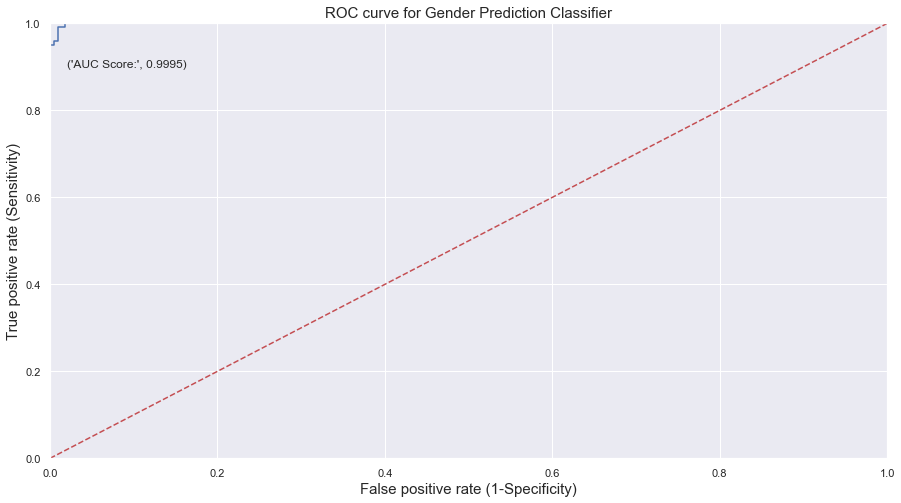

In [178]:
plot_roc(gboost_model)

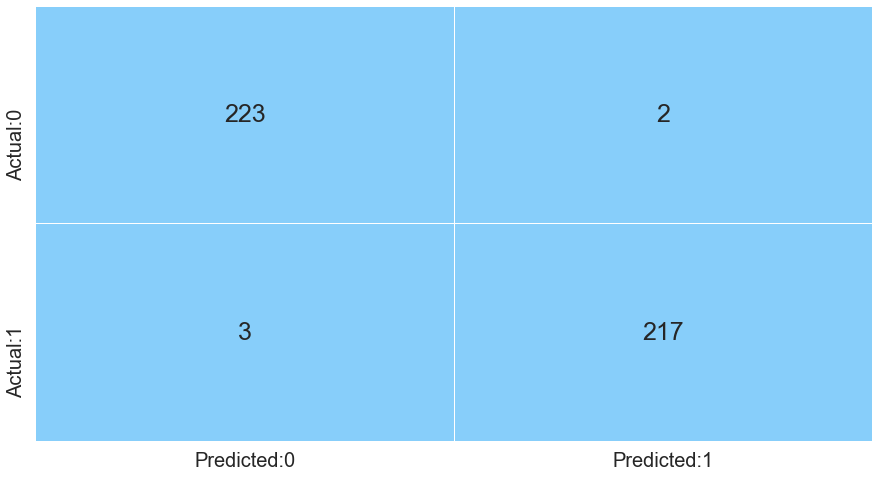

In [179]:
plot_confusion_matrix(gboost_model)

In [180]:
update_model_score_card(algorithm_name = 'Gradient Boosting Classifier', model = gboost_model)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350
7,Gradient Boosting Classifier,0.999515,0.990868,0.986364,1.000000,0.988764,0.988610


# 13. XG Boost <a id = 'xgb'></a>

In [181]:
xgb_model = XGBClassifier(learning_rate = 0.01, gamma = 2,verbosity = 0)

# fit the model using fit() on train data
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=2, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=0)

In [182]:
print(get_train_report(xgb_model))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       891
           1       0.99      0.99      0.99       886

    accuracy                           0.99      1777
   macro avg       0.99      0.99      0.99      1777
weighted avg       0.99      0.99      0.99      1777



In [183]:
print(get_test_report(xgb_model))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       225
           1       0.99      0.97      0.98       220

    accuracy                           0.98       445
   macro avg       0.98      0.98      0.98       445
weighted avg       0.98      0.98      0.98       445



**Tuning Hyperparameters**

In [184]:
# create a dictionary with hyperparameters and its values
# learning_rate: pass the list of boosting learning rates
# max_depth: pass the range of values as the maximum tree depth for base learners
# gamma: pass the list of minimum loss reduction values required to make a further partition on a leaf node of the tree
tuning_parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
                     'max_depth': [3,4,5,6,7,8,9,10],
                     'gamma': [0, 1, 2, 3, 4]}

# instantiate the 'XGBClassifier' 
xgb_model = XGBClassifier()

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the XGBoost classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 3
# scoring: pass a measure to evaluate the model on test set
xgb_grid = GridSearchCV(estimator = xgb_model, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc',verbose=0)

# fit the model on X_train and y_train using fit()
xgb_grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for XGBoost classifier: ', xgb_grid.best_params_, '\n')

Best parameters for XGBoost classifier:  {'gamma': 0, 'learning_rate': 0.3, 'max_depth': 5} 



In [185]:
xgb_grid_model = XGBClassifier(learning_rate = xgb_grid.best_params_.get('learning_rate'),
                               max_depth = xgb_grid.best_params_.get('max_depth'),
                               gamma = xgb_grid.best_params_.get('gamma'))

xgb_model = xgb_grid_model.fit(X_train, y_train)

In [186]:
print(get_train_report(xgb_model))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       891
           1       1.00      1.00      1.00       886

    accuracy                           1.00      1777
   macro avg       1.00      1.00      1.00      1777
weighted avg       1.00      1.00      1.00      1777



In [187]:
print(get_test_report(xgb_model))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       225
           1       0.99      0.98      0.99       220

    accuracy                           0.99       445
   macro avg       0.99      0.99      0.99       445
weighted avg       0.99      0.99      0.99       445



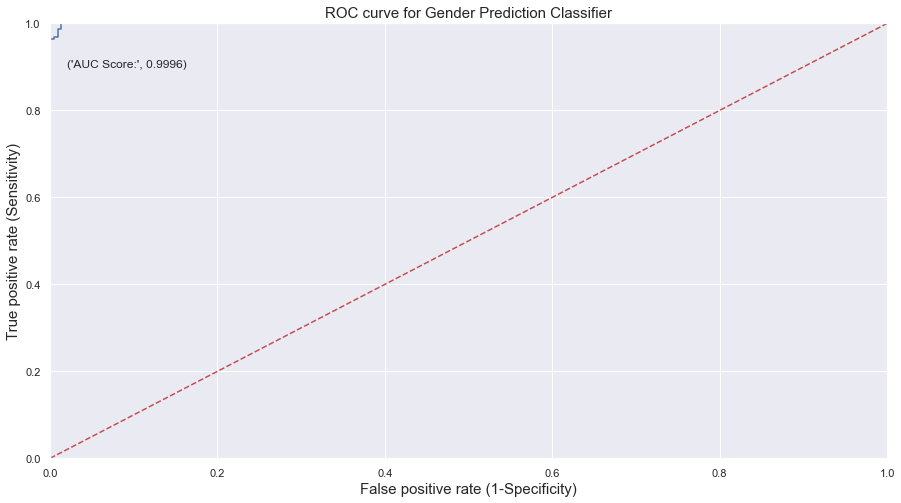

In [188]:
plot_roc(xgb_model)

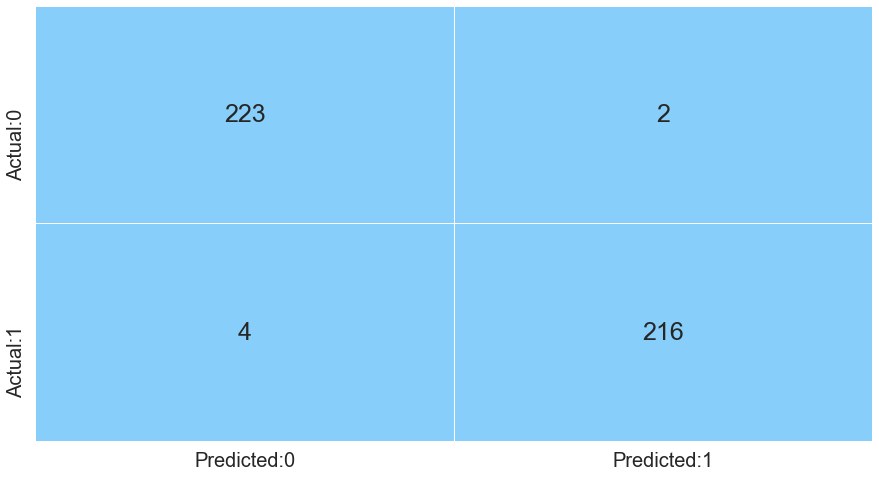

In [189]:
plot_confusion_matrix(xgb_model)

In [190]:
update_model_score_card(algorithm_name = 'XGB Classifier', model = xgb_model)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350
7,Gradient Boosting Classifier,0.999515,0.990868,0.986364,1.000000,0.988764,0.988610
8,XGB Classifier,0.999636,0.990826,0.981818,1.000000,0.986517,0.986301


# 14. Stacking <a id = 'stack'></a>

### 14.1 Stacking model with AdaBoostClassifier as final estimator <a id = 'stack_ada'></a>

In [191]:
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_depth = 7, max_features = 'sqrt', 
                                                     max_leaf_nodes = 8, min_samples_leaf = 5, min_samples_split = 8, 
                                                     n_estimators = 30, random_state = 10)),
                 ('Decision_Tree', DecisionTreeClassifier(criterion = 'entropy',
                                  max_depth = 6,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 7,
                                  random_state = 10)),
                 ('Naive Bayes', MultinomialNB())]

# initialize stacking classifier 
# pass the base learners to the parameter, 'estimators'
# pass the Naive Bayes model as the 'final_estimator'/ meta model
stack_model1 = StackingClassifier(estimators = base_learners, final_estimator = AdaBoostClassifier(learning_rate = 0.7, n_estimators = 90))

# fit the model on train dataset
stack_model1.fit(X_train, y_train)

StackingClassifier(estimators=[('rf_model',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=7,
                                                       max_features='sqrt',
                                                       max_leaf_nodes=8,
                                                       min_samples_leaf=5,
                                                       min_samples_split=8,
                                                       n_estimators=30,
                                                       random_state=10)),
                               ('Decision_Tree',
                                DecisionTreeClassifier(criterion='entropy',
                                                       max_depth=6,
                                                       max_leaf_nodes=7,
                                                       min_samples_split=4,
                        

In [192]:
print(get_train_report(stack_model1))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       891
           1       0.98      0.98      0.98       886

    accuracy                           0.98      1777
   macro avg       0.98      0.98      0.98      1777
weighted avg       0.98      0.98      0.98      1777



In [193]:
print(get_test_report(stack_model1))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       225
           1       0.98      0.96      0.97       220

    accuracy                           0.97       445
   macro avg       0.97      0.97      0.97       445
weighted avg       0.97      0.97      0.97       445



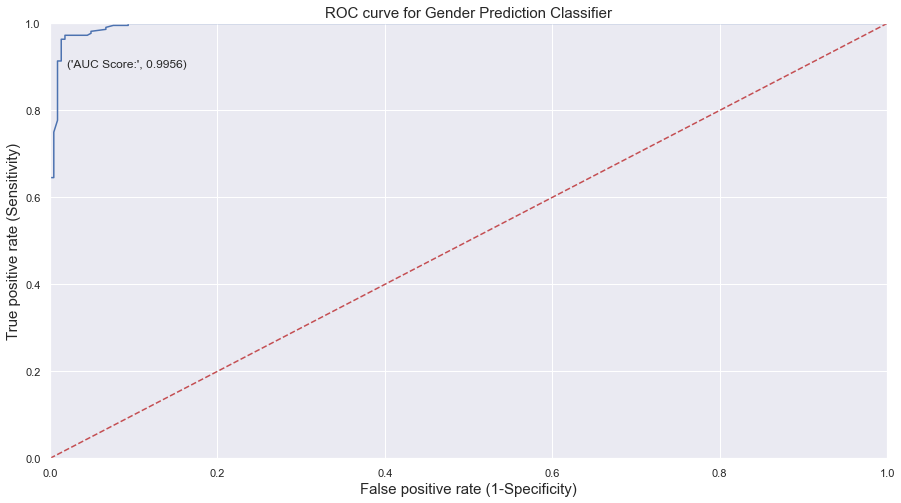

In [194]:
plot_roc(stack_model1)

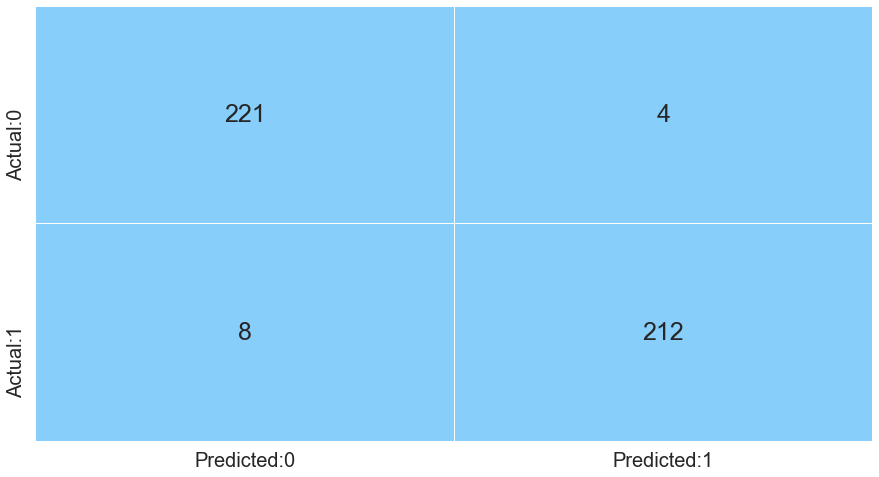

In [195]:
plot_confusion_matrix(stack_model1)

In [196]:
update_model_score_card(algorithm_name = 'Stacking Classifier (AdaBoost estimator)', model = stack_model1)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350
7,Gradient Boosting Classifier,0.999515,0.990868,0.986364,1.000000,0.988764,0.988610
8,XGB Classifier,0.999636,0.990826,0.981818,1.000000,0.986517,0.986301
9,Stacking Classifier (AdaBoost estimator),0.995566,0.981481,0.963636,0.976365,0.973034,0.972477


### 14.2 Stacking model with GradientBoostingClassifier as final estimator <a id = 'stack_gboost'></a>

In [197]:
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_depth = 7, max_features = 'sqrt', 
                                                     max_leaf_nodes = 8, min_samples_leaf = 5, min_samples_split = 8, 
                                                     n_estimators = 30, random_state = 10)),
                 ('Decision_Tree', DecisionTreeClassifier(criterion = 'entropy',
                                  max_depth = 6,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 7,
                                  random_state = 10)),
                 ('KNN', KNeighborsClassifier(n_neighbors = 3,metric = 'manhattan'))]

# initialize stacking classifier 
# pass the base learners to the parameter, 'estimators'
# pass the Naive Bayes model as the 'final_estimator'/ meta model
stack_model2 = StackingClassifier(estimators = base_learners, final_estimator = GradientBoostingClassifier(learning_rate = 0.9, max_depth = 5, n_estimators = 90))

# fit the model on train dataset
stack_model2.fit(X_train, y_train)

StackingClassifier(estimators=[('rf_model',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=7,
                                                       max_features='sqrt',
                                                       max_leaf_nodes=8,
                                                       min_samples_leaf=5,
                                                       min_samples_split=8,
                                                       n_estimators=30,
                                                       random_state=10)),
                               ('Decision_Tree',
                                DecisionTreeClassifier(criterion='entropy',
                                                       max_depth=6,
                                                       max_leaf_nodes=7,
                                                       min_samples_split=4,
                        

In [198]:
print(get_train_report(stack_model2))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       891
           1       0.98      0.98      0.98       886

    accuracy                           0.98      1777
   macro avg       0.98      0.98      0.98      1777
weighted avg       0.98      0.98      0.98      1777



In [199]:
print(get_test_report(stack_model2))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       225
           1       0.97      0.97      0.97       220

    accuracy                           0.97       445
   macro avg       0.97      0.97      0.97       445
weighted avg       0.97      0.97      0.97       445



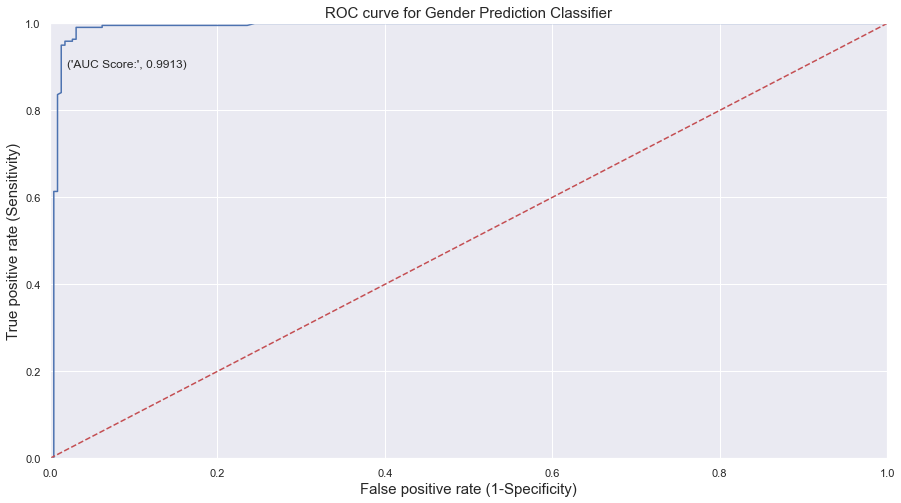

In [200]:
plot_roc(stack_model2)

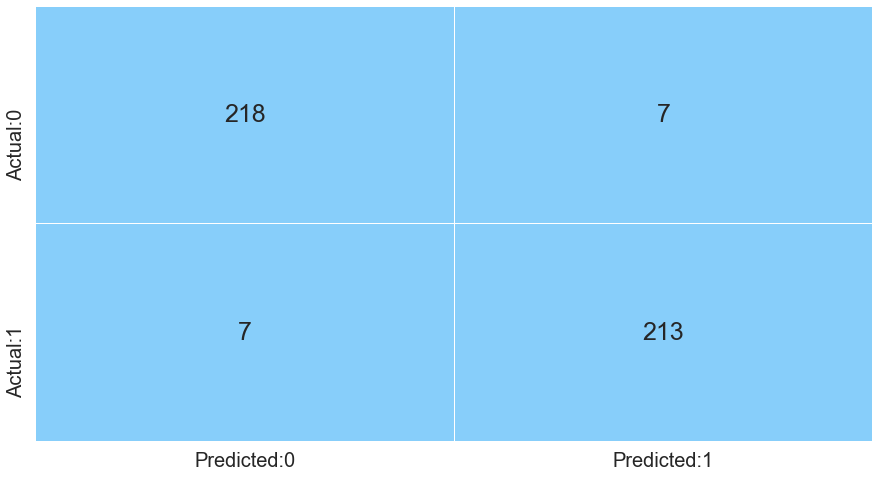

In [201]:
plot_confusion_matrix(stack_model2)

In [202]:
update_model_score_card(algorithm_name = 'Stacking Classifier (Gradient Boosting estimator)', model = stack_model2)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350
7,Gradient Boosting Classifier,0.999515,0.990868,0.986364,1.000000,0.988764,0.988610
8,XGB Classifier,0.999636,0.990826,0.981818,1.000000,0.986517,0.986301
9,Stacking Classifier (AdaBoost estimator),0.995566,0.981481,0.963636,0.976365,0.973034,0.972477


### 14.3 Stacking model with XGBoostClassifier as final estimator <a id = 'stack_xgb'></a>

In [203]:
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_depth = 7, max_features = 'sqrt', 
                                                     max_leaf_nodes = 8, min_samples_leaf = 5, min_samples_split = 8, 
                                                     n_estimators = 30, random_state = 10)),
                 ('Decision_Tree', DecisionTreeClassifier(criterion = 'entropy',
                                  max_depth = 6,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 7,
                                  random_state = 10)),
                 ('Logistic_Regression', LogisticRegression())]

# initialize stacking classifier 
# pass the base learners to the parameter, 'estimators'
# pass the Naive Bayes model as the 'final_estimator'/ meta model
stack_model3 = StackingClassifier(estimators = base_learners, final_estimator = XGBClassifier(learning_rate = 0.3, max_depth = 5, gamma = 0))

# fit the model on train dataset
stack_model3.fit(X_train, y_train)

StackingClassifier(estimators=[('rf_model',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=7,
                                                       max_features='sqrt',
                                                       max_leaf_nodes=8,
                                                       min_samples_leaf=5,
                                                       min_samples_split=8,
                                                       n_estimators=30,
                                                       random_state=10)),
                               ('Decision_Tree',
                                DecisionTreeClassifier(criterion='entropy',
                                                       max_depth=6,
                                                       max_leaf_nodes=7,
                                                       min_samples_split=4,
                        

In [204]:
print(get_train_report(stack_model3))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       891
           1       0.98      0.97      0.97       886

    accuracy                           0.97      1777
   macro avg       0.97      0.97      0.97      1777
weighted avg       0.97      0.97      0.97      1777



In [205]:
print(get_test_report(stack_model3))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       225
           1       0.97      0.96      0.97       220

    accuracy                           0.97       445
   macro avg       0.97      0.97      0.97       445
weighted avg       0.97      0.97      0.97       445



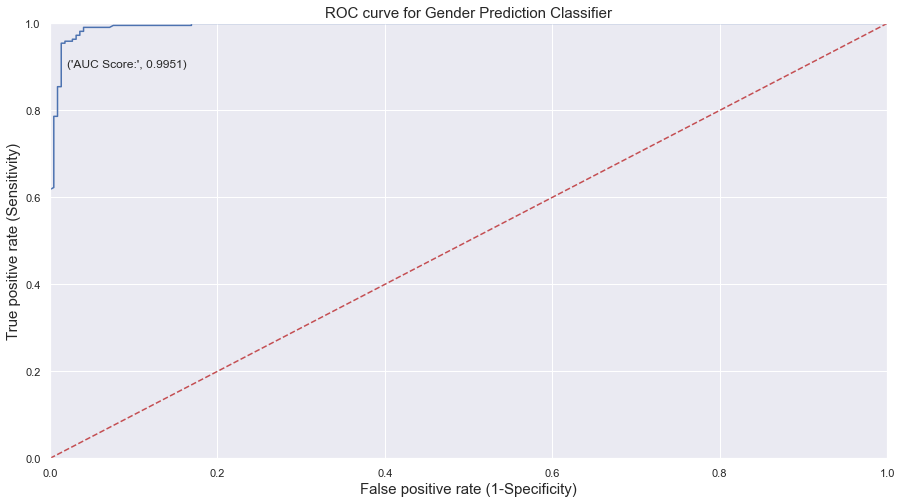

In [206]:
plot_roc(stack_model3)

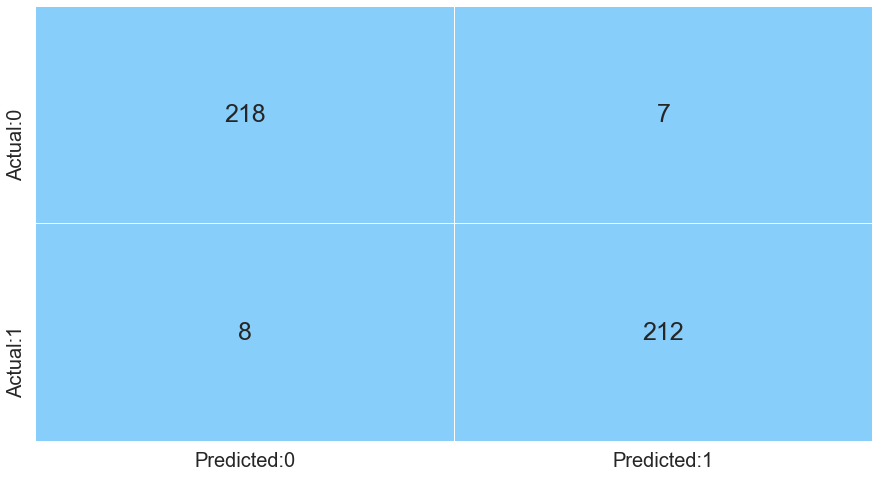

In [207]:
plot_confusion_matrix(stack_model3)

In [208]:
update_model_score_card(algorithm_name = 'Stacking Classifier (XB Boost estimator)', model = stack_model3)

model_score_card

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
1,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
2,Multinomial Naive Bayes,0.874667,0.886486,0.745455,0.821609,0.826966,0.809877
3,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
4,Decision Tree Classifier,0.980636,0.955157,0.968182,0.993247,0.961798,0.961625
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350
7,Gradient Boosting Classifier,0.999515,0.990868,0.986364,1.000000,0.988764,0.988610
8,XGB Classifier,0.999636,0.990826,0.981818,1.000000,0.986517,0.986301
9,Stacking Classifier (AdaBoost estimator),0.995566,0.981481,0.963636,0.976365,0.973034,0.972477


# 15. Displaying Score Summary <a id = 'dis_sco_sum'></a>

In [209]:
model_score_card1 = model_score_card.sort_values('Accuracy Score (Test)',ascending = False).reset_index(drop = True)

model_score_card1.style.highlight_max(color = 'lightblue', subset = 'Accuracy Score (Test)')

,Model Name,AUC Score,Precision Score,Recall Score,Accuracy Score (Train),Accuracy Score (Test),f1-score
0,Gradient Boosting Classifier,0.999515,0.990868,0.986364,1.000000,0.988764,0.988610
1,K-Nearest Neighbours,0.992253,0.990826,0.981818,0.989308,0.986517,0.986301
2,XGB Classifier,0.999636,0.990826,0.981818,1.000000,0.986517,0.986301
3,Logistic Regression with cutoff determined,0.979747,0.981735,0.977273,0.974114,0.979775,0.979499
4,Logistic Regression with Feature Selection,0.977424,0.986111,0.968182,0.970737,0.977528,0.977064
5,Random Forest Classifier,0.998808,0.986111,0.968182,0.993810,0.977528,0.977064
6,AdaBoost Classifier,0.995566,0.985981,0.959091,0.972988,0.973034,0.972350
7,Stacking Classifier (AdaBoost estimator),0.995566,0.981481,0.963636,0.976365,0.973034,0.972477
8,Stacking Classifier (Gradient Boosting estimator),0.991283,0.968182,0.968182,0.980867,0.968539,0.968182
9,Stacking Classifier (XB Boost estimator),0.995051,0.968037,0.963636,0.974676,0.966292,0.965831


<b>Interpretation</b>: We can see that Gradient Boosting Classifier has the best accuracy score.

# 16. Deployment Link <a id = 'depl'></a>

https://gender-recognition-by-voice.herokuapp.com/

# 17. Conclusion <a id = 'conclu'></a>

<br> 1. Of all the models built, we see that Gradient Boosting Classifier model has the best accuracy score of 0.9887.</br>
<br> 2. The features that play the most important role in identifying the gender by voice are `meanfun`, `sd`, `Q25`, `sfm`,`sp.ent` and `meanfreq`. </br>

# 18. References<a id='Refer'></a>

https://iopscience.iop.org/article/10.1088/1757-899X/263/4/042083/pdf

https://sci-hub.se/10.1109/IC3.2018.8530520

https://sci-hub.se/10.1109/ISMSIT.2019.8932818

https://sci-hub.se/10.1109/ICABCD.2018.8465466

https://www.slideshare.net/irjetjournal/irjet-voice-based-gender-recognition

<table align="center" width=100%>
    <tr>
        <td width="25%">
            <img src="gender.png">
        </td>
        <td>
            <div align="center">
                <font color="#21618C" size=24px>
                    <b>Thank You
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>